<a href="https://colab.research.google.com/github/sperezg6/Tesina/blob/main/Code/modelado_generacion_musical_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pretty_midi
!pip install pypianoroll
!pip install datasets
!pip install torch
!pip install matplotlib
!pip install seaborn
!pip install music21
!pip install scikit-learn
!pip install tensorflow
!pip install keras

In [ ]:
import pretty_midi
import pandas as pd
import numpy as np
import os
import pypianoroll
import matplotlib.pyplot as plt
from datasets import load_dataset
import random
import seaborn as sns
import torch
import datasets
import music21
from music21 import note, chord
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import concurrent.futures

def extract_notes(file):
    notes = []
    pick = None
    for j in file:
        songs = music21.converter.parse(j).parts
        for part in songs:
            pick = part.recurse()
            for element in pick:
                if isinstance(element, note.Note):
                    notes.append(str(element.pitch))
                elif isinstance(element, chord.Chord):
                    notes.append(".".join(str(n) for n in element.normalOrder))
    return notes

def process_single_midi_file(folder_path, filename):
    try:
        # Load the MIDI file
        midi_path = os.path.join(folder_path, filename)
        midi_data = pretty_midi.PrettyMIDI(midi_path)
        music21_stream = music21.converter.parse(midi_path)  # Parse the MIDI file with music21

        all_notes = []
        pitches = []
        velocities = []
        start_times = []
        durations = []
        pitch_classes = [0] * 12  # 12 pitch classes for chromatic scale
        file_instrument_names = []

        for instrument in midi_data.instruments:
            instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
            file_instrument_names.append(instrument_name)
            for note in instrument.notes:
                note_repr = f"({note.pitch},{note.start:.2f},{note.end:.2f},{note.velocity})"
                all_notes.append(note_repr)
                pitches.append(note.pitch)
                velocities.append(note.velocity)
                start_times.append(note.start)
                durations.append(note.end - note.start)
                pitch_classes[note.pitch % 12] += 1

        # Extracting key using music21
        key = music21_stream.analyze('key')
        main_key = f"{key.tonic.name} {key.mode}"

        instruments_str = ', '.join(set(file_instrument_names))

        # Extract chords using music21
        chords = set()
        for element in music21_stream.recurse().getElementsByClass('Chord'):
            chords.add('.'.join(str(p.midi) for p in element.pitches))

        chords_str = ', '.join(chords)

        notes_str = ' '.join(all_notes)

        avg_pitch = np.mean(pitches) if pitches else 0
        min_pitch = np.min(pitches) if pitches else None
        max_pitch = np.max(pitches) if pitches else None
        avg_velocity = np.mean(velocities) if velocities else 0
        avg_duration = np.mean(durations) if durations else 0

        # Calculating polyphony (simultaneous note occurrences)
        polyphony = len([d for d in durations if d > 0]) / midi_data.get_end_time() if durations else 0

        # Time between consecutive notes
        intervals = np.diff(sorted(start_times))
        avg_interval = np.mean(intervals) if intervals.size > 0 else 0

        tempo_changes = len(midi_data.get_tempo_changes()[0])
        key_signatures = len(midi_data.key_signature_changes)
        time_signatures = len(midi_data.time_signature_changes)

        duration = midi_data.get_end_time()
        num_instruments = len(midi_data.instruments)

        # Extracting notes_v2
        notes_v2 = extract_notes([midi_path])
        notes_v2_str = ' '.join(notes_v2)

        return {
            'filename': filename,
            'num_instruments': num_instruments,
            'instruments': instruments_str,
            'duration': duration,
            'tempo_changes': tempo_changes,
            'key_signatures': key_signatures,
            'time_signatures': time_signatures,
            'avg_pitch': avg_pitch,
            'min_pitch': min_pitch,
            'max_pitch': max_pitch,
            'avg_velocity': avg_velocity,
            'avg_duration': avg_duration,
            'polyphony': polyphony,
            'avg_interval': avg_interval,
            'pitch_classes': pitch_classes,
            'main_key': main_key,
            'chords': chords_str,
            'notes': notes_str,
            'notes_v2': notes_v2_str,
        }
    except Exception as e:
        print(f"Error processing {filename}: {e}")
        return None

def process_midi_files(folder_path):
    file_data = []
    # Create a thread pool
    with concurrent.futures.ThreadPoolExecutor() as executor:
        # Create a future object for each file to be processed in parallel
        futures = [executor.submit(process_single_midi_file, folder_path, filename)
                   for filename in os.listdir(folder_path) if filename.endswith(('.mid', '.midi'))]
        for future in concurrent.futures.as_completed(futures):
            result = future.result()
            if result is not None:
                file_data.append(result)
                print(f"Processed {result['filename']}")
    return pd.DataFrame(file_data)

In [ ]:
#GOOGLE DRIVE PATH
folder_path_colab = '/content/drive/MyDrive/Tesina/Dataset Final'


#HUGGING FACE DATASET
#dataset = load_dataset('SantiagoPG/classical_music')

#midi_data = process_midi_files(folder_path)
#midi_data = process_midi_files(folder_path_colab)

df = pd.read_csv('/content/drive/MyDrive/Tesina/midi_data_v2.csv')
midi_data = df


In [ ]:
midi_data.head()

,filename,num_instruments,instruments,duration,tempo_changes,key_signatures,time_signatures,avg_pitch,min_pitch,max_pitch,avg_velocity,avg_duration,polyphony,avg_interval,pitch_classes,main_key,chords,notes,notes_v2
0,MIDI-Unprocessed_12_R1_2006_01-08_ORIG_MID--AU...,1,Acoustic Grand Piano,240.634115,1,0,1,62.973978,27,95,51.131599,0.327701,5.589399,0.174953,"[31, 106, 287, 12, 141, 22, 169, 160, 13, 192,...",D major,"74.70, 63.72, 64.52, 91.79.85, 62.54.45.38, 74...","(38,0.98,1.24,43) (57,1.70,1.85,42) (62,2.15,2...",D2 A3 D4 A4 D4 A3 F#3 A2 F#3 A2 D4 D2 A3 D4 A4...
1,MIDI-Unprocessed_09_R2_2006_01_ORIG_MID--AUDIO...,1,Acoustic Grand Piano,590.493490,1,0,1,57.073896,28,88,53.647136,0.542829,3.873032,0.256982,"[110, 358, 148, 129, 277, 104, 193, 79, 276, 3...",C# minor,"45.57.52, 75.80.72, 71.68.64, 64.52, 68.73.64,...","(37,1.00,1.09,42) (49,2.56,2.72,38) (61,2.64,2...",4.8 C#2 4.8 1 C#5 4.8 3.6 3.6 C#2 C#3 C#4 3.6 ...
2,MIDI-Unprocessed_13_R1_2006_01-06_ORIG_MID--AU...,1,Acoustic Grand Piano,236.289062,1,0,1,66.086443,28,104,51.883706,0.357365,6.805224,0.145205,"[68, 121, 71, 304, 143, 32, 91, 80, 304, 40, 1...",G# minor,"74.70, 75.71.55, 59.32, 63.72, 69.73, 78.81, 7...","(68,1.26,1.60,40) (63,1.28,1.61,31) (44,1.52,1...",B3 3.8 G#3 G#2 E-3 E4 G#4 B3 B3 B4 G#4 E-4 E-4...
3,MIDI-Unprocessed_05_R2_2006_01_ORIG_MID--AUDIO...,1,Acoustic Grand Piano,468.100260,1,0,1,57.042795,28,88,48.907860,0.495331,4.892114,0.202605,"[111, 353, 146, 126, 284, 102, 188, 78, 279, 3...",C# minor,"64.55.61, 45.57.52, 71.68.64, 57.33.49.52, 45....","(37,1.02,1.29,32) (49,2.09,2.20,32) (61,2.19,2...",4.8 C#2 4.8 1 C#5 4.8 3.6 3.6 C#2 1 4.8 C#5 F#...
4,MIDI-Unprocessed_08_R1_2006_01-04_ORIG_MID--AU...,1,Acoustic Grand Piano,558.524740,1,0,1,67.498252,29,89,59.771713,0.307065,6.658613,0.148588,"[615, 281, 177, 194, 241, 555, 114, 388, 330, ...",F minor,"70.86.82.67, 85.79, 78.81, 54.42.66, 68.69, 61...","(53,1.03,1.81,26) (60,1.62,1.83,40) (56,1.01,1...",5.8 C4 4.7 C6 5.8.0 C6 8.0 C4 F5 F5 F5 F5 G#3 ...


In [ ]:
midi_data.to_csv('/content/drive/MyDrive/Tesina/midi_data_v2.csv', index=False)

In [ ]:
midi_data.describe()

,num_instruments,duration,tempo_changes,key_signatures,time_signatures,avg_pitch,min_pitch,max_pitch,avg_velocity,avg_duration,polyphony,avg_interval
count,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000
mean,1.283478,528.540993,227.411304,0.561739,1.347826,64.073563,28.433043,95.341739,60.076018,0.268113,9.999907,0.114419
std,0.550011,463.511666,578.898246,1.403439,2.425006,3.591401,4.934765,7.779416,9.490242,0.179255,3.703792,0.051024
min,1.000000,23.343477,1.000000,0.000000,1.000000,49.343878,14.000000,66.000000,25.805295,0.053905,0.824927,0.044075
25%,1.000000,224.654626,1.000000,0.000000,1.000000,61.807476,24.000000,89.000000,53.840457,0.159592,7.359744,0.080772
50%,1.000000,369.778160,1.000000,0.000000,1.000000,63.857660,29.000000,97.000000,62.154325,0.218812,9.480103,0.104668
75%,2.000000,665.701042,1.750000,1.000000,1.000000,66.084870,31.000000,101.000000,67.312413,0.315737,12.257988,0.133265
max,6.000000,3752.264323,6096.000000,16.000000,59.000000,77.367489,55.000000,108.000000,81.079620,1.585737,22.653127,0.661615


In [ ]:
midi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1150 entries, 0 to 1149
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   filename         1150 non-null   object 
 1   num_instruments  1150 non-null   int64  
 2   instruments      1150 non-null   object 
 3   duration         1150 non-null   float64
 4   tempo_changes    1150 non-null   int64  
 5   key_signatures   1150 non-null   int64  
 6   time_signatures  1150 non-null   int64  
 7   avg_pitch        1150 non-null   float64
 8   min_pitch        1150 non-null   int64  
 9   max_pitch        1150 non-null   int64  
 10  avg_velocity     1150 non-null   float64
 11  avg_duration     1150 non-null   float64
 12  polyphony        1150 non-null   float64
 13  avg_interval     1150 non-null   float64
 14  pitch_classes    1150 non-null   object 
 15  main_key         1150 non-null   object 
 16  chords           1149 non-null   object 
 17  notes         

In [ ]:
midi_data['duration'].sum()

total_duration = midi_data['duration'].sum()/60
print(f"Total duration of all MIDI files: {total_duration:,.2f} minutes")

Total duration of all MIDI files: 10,130.37 minutes


In [ ]:
midi_data.head(10).to_csv('midi_data_prueba.csv', index=False)

In [ ]:
def count_notes(note_str):
    return len(note_str.split(' ')) if pd.notna(note_str) else 0

In [ ]:
tota_notes= midi_data['notes_v2'].apply(count_notes).sum()
#change format to be readable
tota_notes = "{:,}".format(tota_notes)
print(f"Total notes: {tota_notes}")

Total notes: 3,210,417


In [ ]:
avg_notes = midi_data['notes_v2'].apply(count_notes).mean()
#change format to be readable
avg_notes = "{:,}".format(avg_notes)
print(f"Average notes per song: {avg_notes}")

Average notes per song: 2,791.666956521739


In [ ]:
def count_chords(chords_str):
    return len(chords_str.split(', ')) if pd.notna(chords_str) else 0

In [ ]:
tota_chords = midi_data['chords'].apply(count_chords).sum()
#change format to be readable
tota_chords = "{:,}".format(tota_chords)
print(f"Total chords: {tota_chords}")

Total chords: 980,317


In [ ]:
%pip install IPython

In [ ]:
#Extract all notes_v2 from the midi_dataset
Corpus = midi_data['notes_v2'].tolist()

In [ ]:
print(len(Corpus))

1150


In [ ]:
print("First fifty values in the Corpus:", Corpus[:50])


First fifty values in the Corpus: ['D2 A3 D4 A4 D4 A3 F#3 A2 F#3 A2 D4 D2 A3 D4 A4 D4 A3 F#3 A2 D4 A4 F#4 D2 A3 A4 D4 A3 E4 C#4 F#4 7.9 A3 F#4 D4 D3 A3 A4 D4 B3 A3 9.2 F#4 A3 C#4 D2 A3 7.9 B3 9.2 E4 D4 A3 E4 A3 A4 D4 D3 B3 C#4 C#4 A3 7.9 A3 F#4 C#4 9.0 D5 E4 D3 G4 B3 B3 D5 D2 F#4 D4 F#4 B3 D4 G4 B-3 B3 G4 D5 D3 B3 D5 D4 B3 D4 G3 G4 B3 F#3 G3 G3 B3 B4 B3 E4 D2 D4 G3 B3 0.6 9.2 E4 G4 G3 C5 B3 F#4 D3 E4 B3 D5 D4 B3 G#4 F4 B3 2.5 G4 A3 9.1 C#4 C#5 F#4 C#4 F#4 A4 F#1 G#4 A3 G#4 F#4 2.5 B3 D5 A3 F4 C#4 A4 F#2 C#3 F#4 A4 A3 C#4 C#5 F#4 A3 10.2 2.7 F#4 A4 C#3 G2 D4 A4 F#4 F#4 F#3 D4 D2 A3 10.2 2.7 A3 B-3 B-4 G3 F#4 1.4 A3 D4 F#4 D4 D3 A3 A4 D4 A3 1.4 G3 F#4 A3 D4 B-2 F#4 11.2 D4 F#3 F#3 B1 1.4 B3 F#4 D3 F#2 C#5 F#3 9 D5 9.1.2 D4 4 F#2 D4 B2 A4 G3 E3 D4 D4 7.11.2 6.11 C#5 9.1.2 D4 2.4 B3 G3 E3 D4 B3 A1 E3 F#4 A4 F#4 E4 D4 B3 G4 D4 1.7 A3 E3 B2 C#3 A2 F#3 2.6 D5 F#3 D2 A2 B4 C#5 A2 9.2 B4 E4 2.6 1.7 B4 D2 9.1 D5 C#5 A4 D4 B3 A2 6.11 F#4 6.9 6.7 D2 G4 1.2 G3 G4 G3 A4 E4 7.9 B3 C#4 D4 A4 9.1 11.2 

In [ ]:
def split_corpus(corpus):
    split_corpus = []
    for item in corpus:
        split_items = item.split()  # Split each string by spaces to preserve full notes
        split_corpus.extend(split_items)  # Add the split items to the new list
    return split_corpus

Corpus = split_corpus(Corpus)

In [ ]:
print("First fifty values in the Corpus:", Corpus[:50])

First fifty values in the Corpus: ['D2', 'A3', 'D4', 'A4', 'D4', 'A3', 'F#3', 'A2', 'F#3', 'A2', 'D4', 'D2', 'A3', 'D4', 'A4', 'D4', 'A3', 'F#3', 'A2', 'D4', 'A4', 'F#4', 'D2', 'A3', 'A4', 'D4', 'A3', 'E4', 'C#4', 'F#4', '7.9', 'A3', 'F#4', 'D4', 'D3', 'A3', 'A4', 'D4', 'B3', 'A3', '9.2', 'F#4', 'A3', 'C#4', 'D2', 'A3', '7.9', 'B3', '9.2', 'E4']


In [ ]:
print(len(Corpus))

3210417


In [ ]:
!apt-get install -y lilypond

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
lilypond is already the newest version (2.22.1-2).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


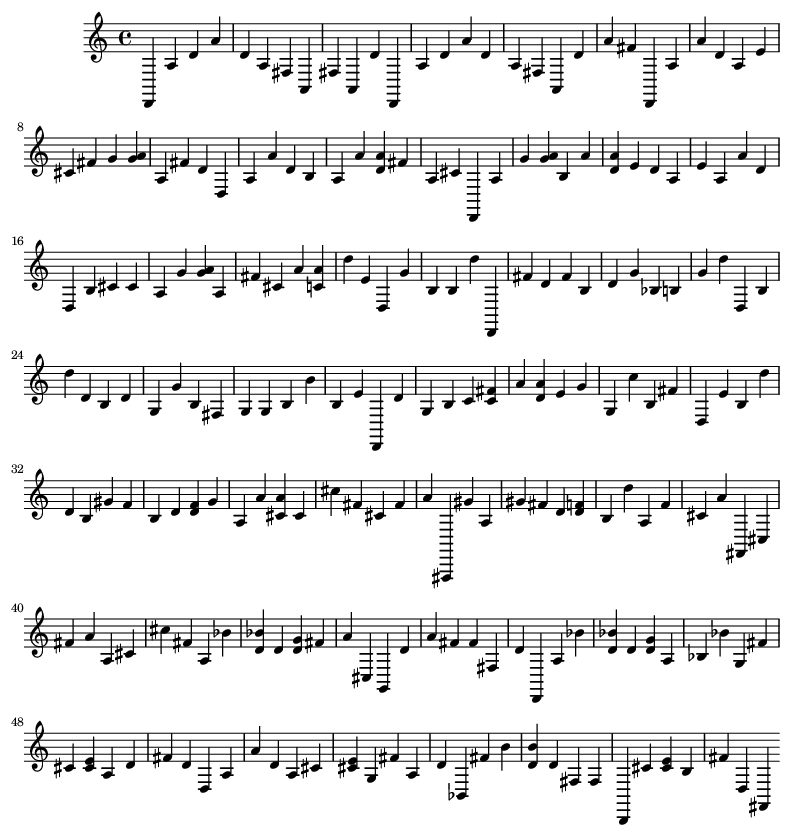

In [ ]:
import IPython
from music21 import *
from IPython.display import Image, Audio

#First Lets write some functions that we need to look into the data
def show(music):
    display(Image(str(music.write("lily.png"))))

def chords_n_notes(Snippet):
    Melody = []
    offset = 0 #Incremental
    for i in Snippet:
        #If it is chord
        if ("." in i or i.isdigit()):
            chord_notes = i.split(".") #Seperating the notes in chord
            notes = []
            for j in chord_notes:
                inst_note=int(j)
                note_snip = note.Note(inst_note)
                notes.append(note_snip)
                chord_snip = chord.Chord(notes)
                chord_snip.offset = offset
                Melody.append(chord_snip)
        # pattern is a note
        else:
            note_snip = note.Note(i)
            note_snip.offset = offset
            Melody.append(note_snip)
        # increase offset each iteration so that notes do not stack
        offset += 1
    Melody_midi = stream.Stream(Melody)
    return Melody_midi

Melody_Snippet = chords_n_notes(Corpus[:200])
show(Melody_Snippet)

In [ ]:
!pip install pydub
!pip install midi2audio

In [ ]:
Melody_Snippet.write('midi',"Corpus_Snippet.mid")


'Corpus_Snippet.mid'

In [ ]:
def plot_instrument_distribution(midi_data):
    # Create the countplot
    ax = sns.countplot(x='num_instruments', data=midi_data)
    plt.title('Distribution of Number of Instruments')

    # Adding values on top of the bars
    for p in ax.patches:
        # Get the height of the bar (which represents the data value)
        height = p.get_height()
        # Place a text label above the bar
        ax.text(p.get_x() + p.get_width() / 2., height + 0.1, '%d' % int(height), ha='center')

    plt.show()

In [ ]:
midi_data['instruments'].unique()

array(['Acoustic Grand Piano', 'Bright Acoustic Piano',
       'Acoustic Grand Piano, Acoustic Bass',
       'Acoustic Grand Piano, Acoustic Bass, Violin',
       'Electric Piano 1, Acoustic Bass'], dtype=object)

In [ ]:
#Delete rows with other instruments that are not Acoustic Grand Piano
midi_data = midi_data[midi_data['instruments'] == 'Acoustic Grand Piano']

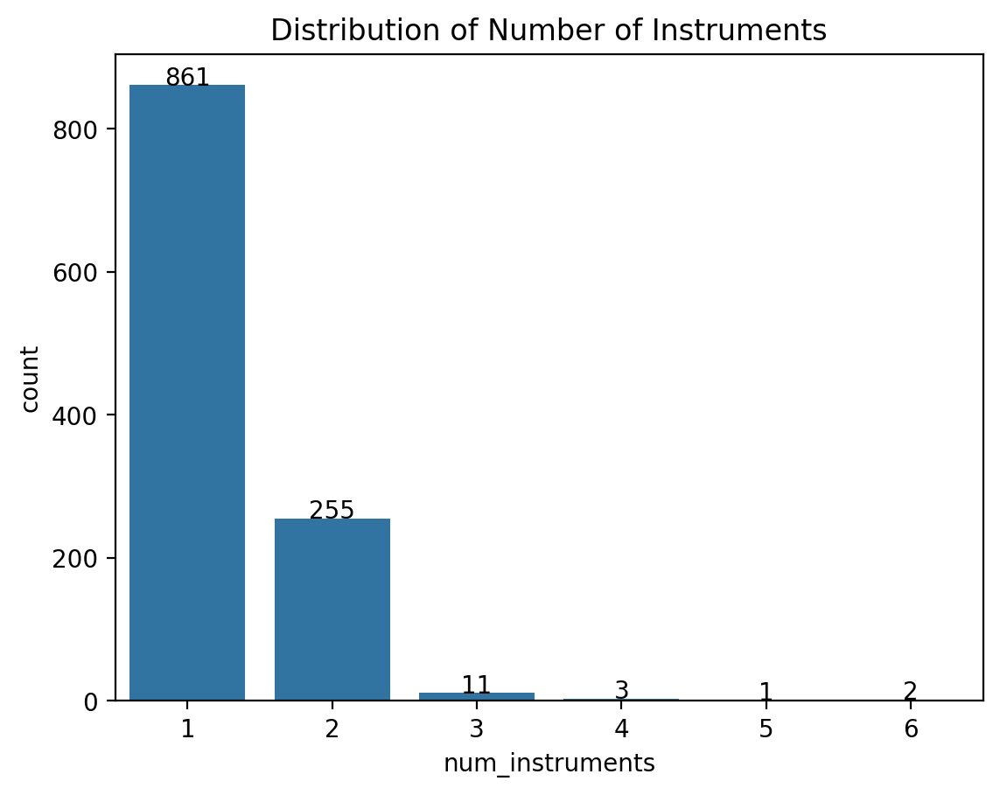

In [ ]:
plot_instrument_distribution(midi_data)

In [ ]:
midi_data['instruments'].unique()

array(['Acoustic Grand Piano'], dtype=object)

In [ ]:
#Delete rows with 3 or more instruments
midi_data = midi_data[midi_data['num_instruments'] <= 2]

In [ ]:
midi_data.head()

,filename,num_instruments,instruments,duration,tempo_changes,key_signatures,time_signatures,avg_pitch,min_pitch,max_pitch,avg_velocity,avg_duration,polyphony,avg_interval,pitch_classes,main_key,chords,notes,notes_v2
0,MIDI-Unprocessed_12_R1_2006_01-08_ORIG_MID--AU...,1,Acoustic Grand Piano,240.634115,1,0,1,62.973978,27,95,51.131599,0.327701,5.589399,0.174953,"[31, 106, 287, 12, 141, 22, 169, 160, 13, 192,...",D major,"74.70, 63.72, 64.52, 91.79.85, 62.54.45.38, 74...","(38,0.98,1.24,43) (57,1.70,1.85,42) (62,2.15,2...",D2 A3 D4 A4 D4 A3 F#3 A2 F#3 A2 D4 D2 A3 D4 A4...
1,MIDI-Unprocessed_09_R2_2006_01_ORIG_MID--AUDIO...,1,Acoustic Grand Piano,590.493490,1,0,1,57.073896,28,88,53.647136,0.542829,3.873032,0.256982,"[110, 358, 148, 129, 277, 104, 193, 79, 276, 3...",C# minor,"45.57.52, 75.80.72, 71.68.64, 64.52, 68.73.64,...","(37,1.00,1.09,42) (49,2.56,2.72,38) (61,2.64,2...",4.8 C#2 4.8 1 C#5 4.8 3.6 3.6 C#2 C#3 C#4 3.6 ...
2,MIDI-Unprocessed_13_R1_2006_01-06_ORIG_MID--AU...,1,Acoustic Grand Piano,236.289062,1,0,1,66.086443,28,104,51.883706,0.357365,6.805224,0.145205,"[68, 121, 71, 304, 143, 32, 91, 80, 304, 40, 1...",G# minor,"74.70, 75.71.55, 59.32, 63.72, 69.73, 78.81, 7...","(68,1.26,1.60,40) (63,1.28,1.61,31) (44,1.52,1...",B3 3.8 G#3 G#2 E-3 E4 G#4 B3 B3 B4 G#4 E-4 E-4...
3,MIDI-Unprocessed_05_R2_2006_01_ORIG_MID--AUDIO...,1,Acoustic Grand Piano,468.100260,1,0,1,57.042795,28,88,48.907860,0.495331,4.892114,0.202605,"[111, 353, 146, 126, 284, 102, 188, 78, 279, 3...",C# minor,"64.55.61, 45.57.52, 71.68.64, 57.33.49.52, 45....","(37,1.02,1.29,32) (49,2.09,2.20,32) (61,2.19,2...",4.8 C#2 4.8 1 C#5 4.8 3.6 3.6 C#2 1 4.8 C#5 F#...
4,MIDI-Unprocessed_08_R1_2006_01-04_ORIG_MID--AU...,1,Acoustic Grand Piano,558.524740,1,0,1,67.498252,29,89,59.771713,0.307065,6.658613,0.148588,"[615, 281, 177, 194, 241, 555, 114, 388, 330, ...",F minor,"70.86.82.67, 85.79, 78.81, 54.42.66, 68.69, 61...","(53,1.03,1.81,26) (60,1.62,1.83,40) (56,1.01,1...",5.8 C4 4.7 C6 5.8.0 C6 8.0 C4 F5 F5 F5 F5 G#3 ...


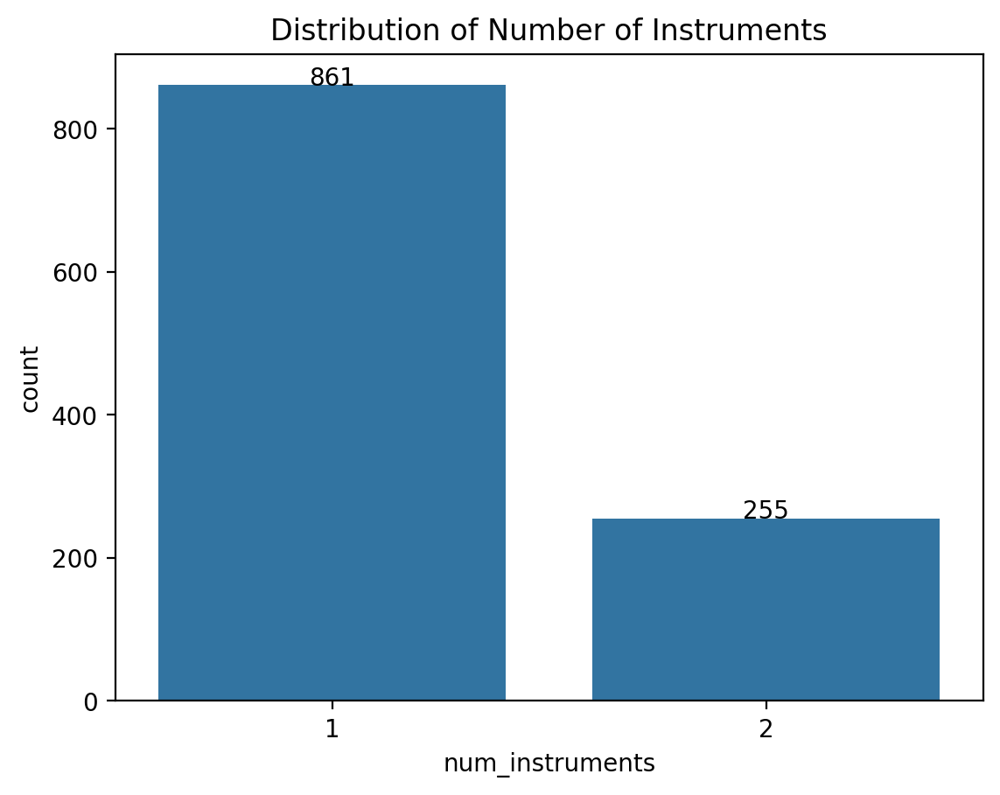

In [ ]:
plot_instrument_distribution(midi_data)

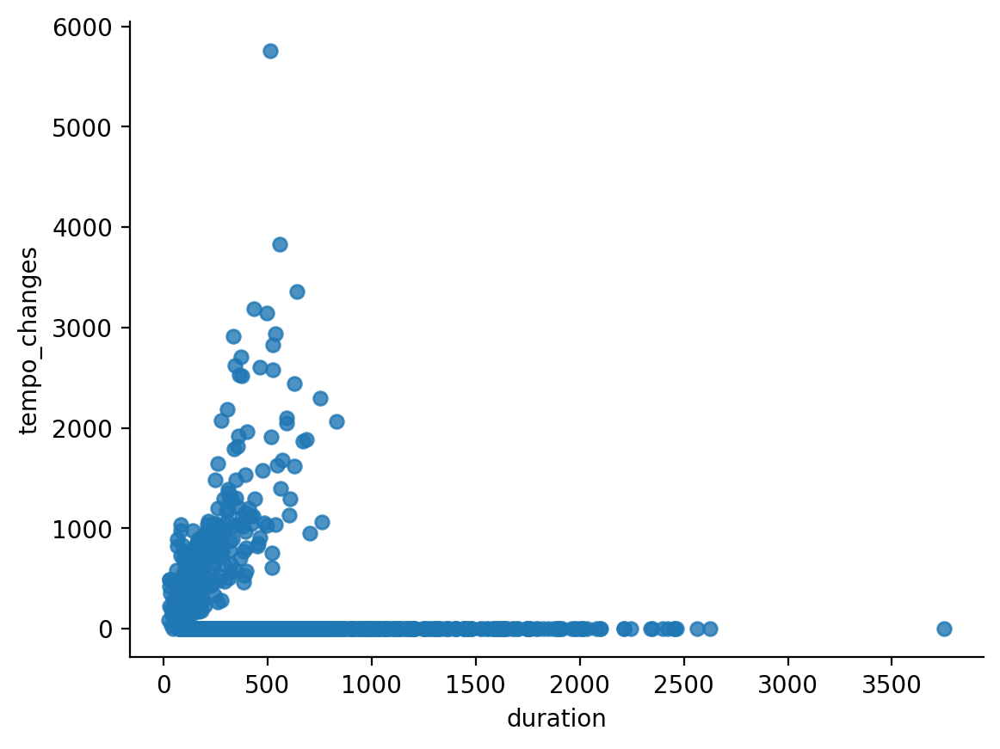

In [ ]:
# @title duration vs tempo_changes

from matplotlib import pyplot as plt
midi_data.plot(kind='scatter', x='duration', y='tempo_changes', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
tota_notes= midi_data['notes_v2'].apply(count_notes).sum()
#change format to be readable
tota_notes = "{:,}".format(tota_notes)
print(f"Total notes: {tota_notes}")

Total notes: 3,129,148


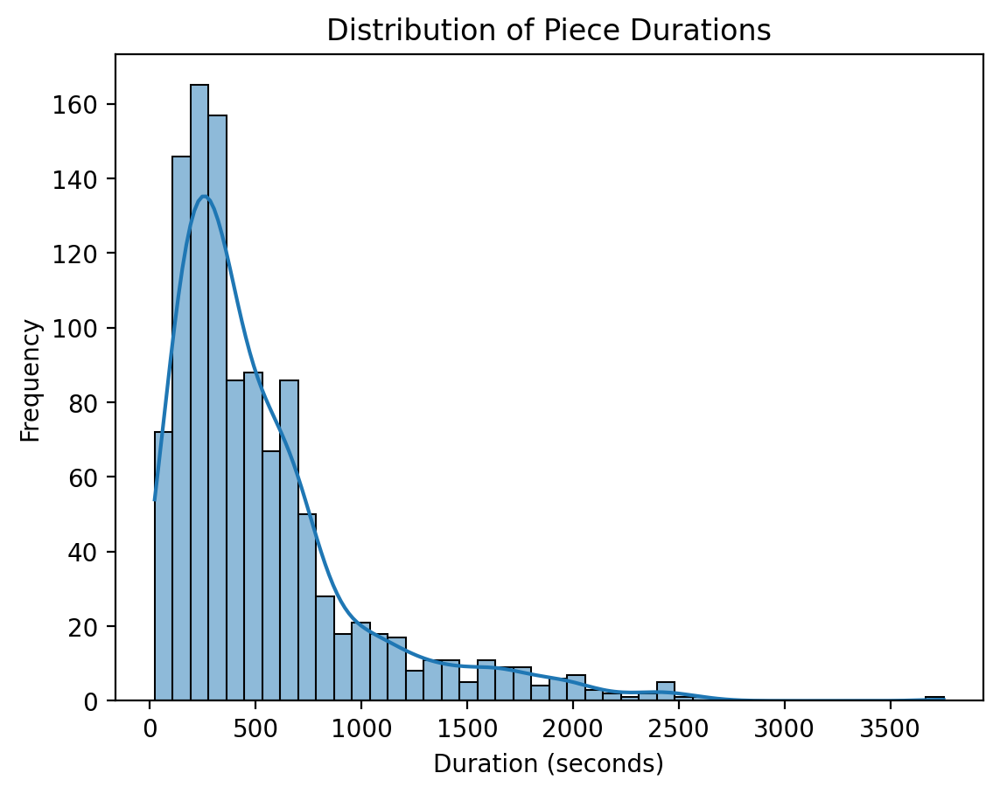

In [ ]:
# Histogram of durations
sns.histplot(midi_data['duration'], kde=True)
plt.title('Distribution of Piece Durations')
plt.xlabel('Duration (seconds)')
plt.ylabel('Frequency')
plt.show()

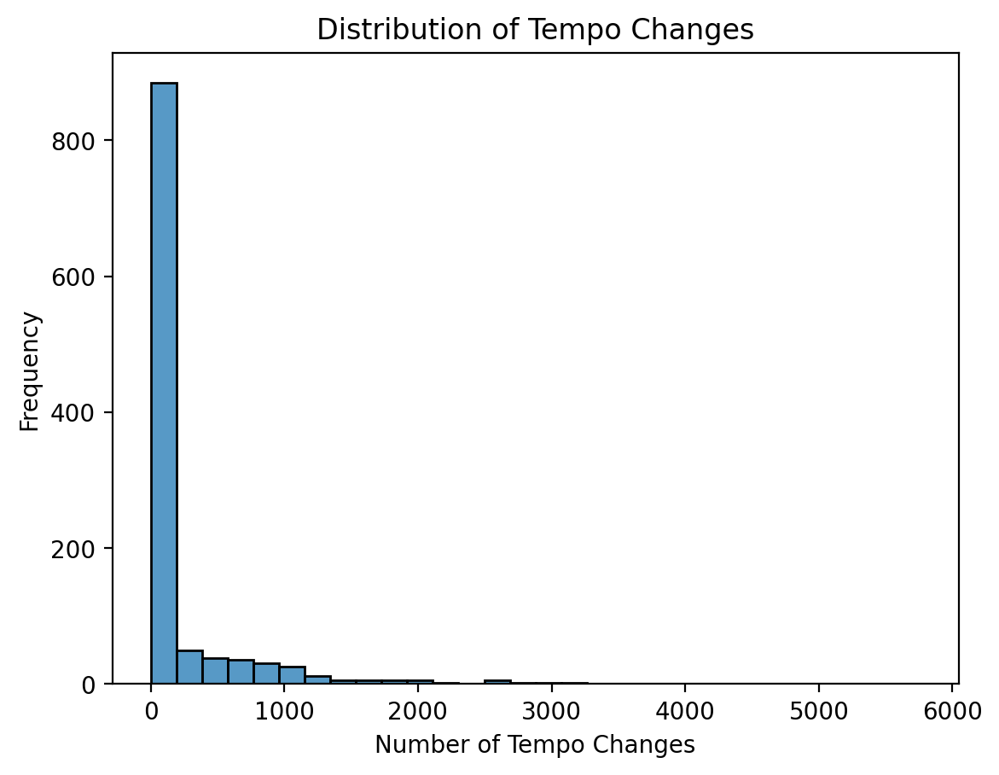

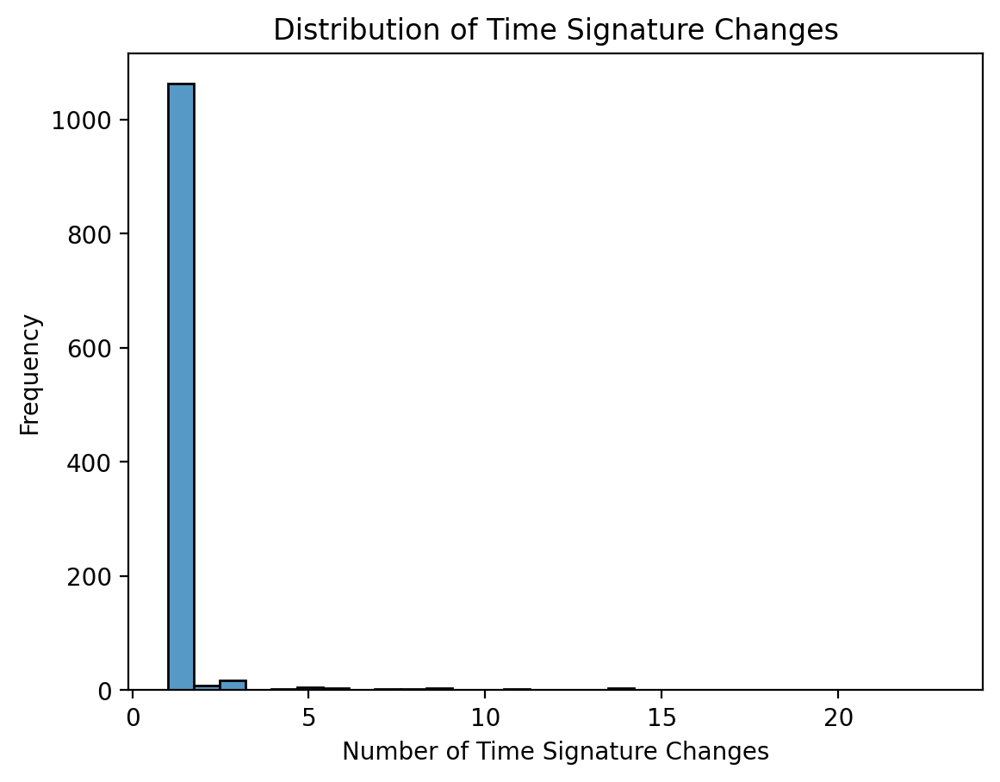

In [ ]:
# Histogram of tempo changes
sns.histplot(midi_data['tempo_changes'], bins=30)
plt.title('Distribution of Tempo Changes')
plt.xlabel('Number of Tempo Changes')
plt.ylabel('Frequency')
plt.show()

# Histogram of time signature changes
sns.histplot(midi_data['time_signatures'], bins=30)
plt.title('Distribution of Time Signature Changes')
plt.xlabel('Number of Time Signature Changes')
plt.ylabel('Frequency')
plt.show()

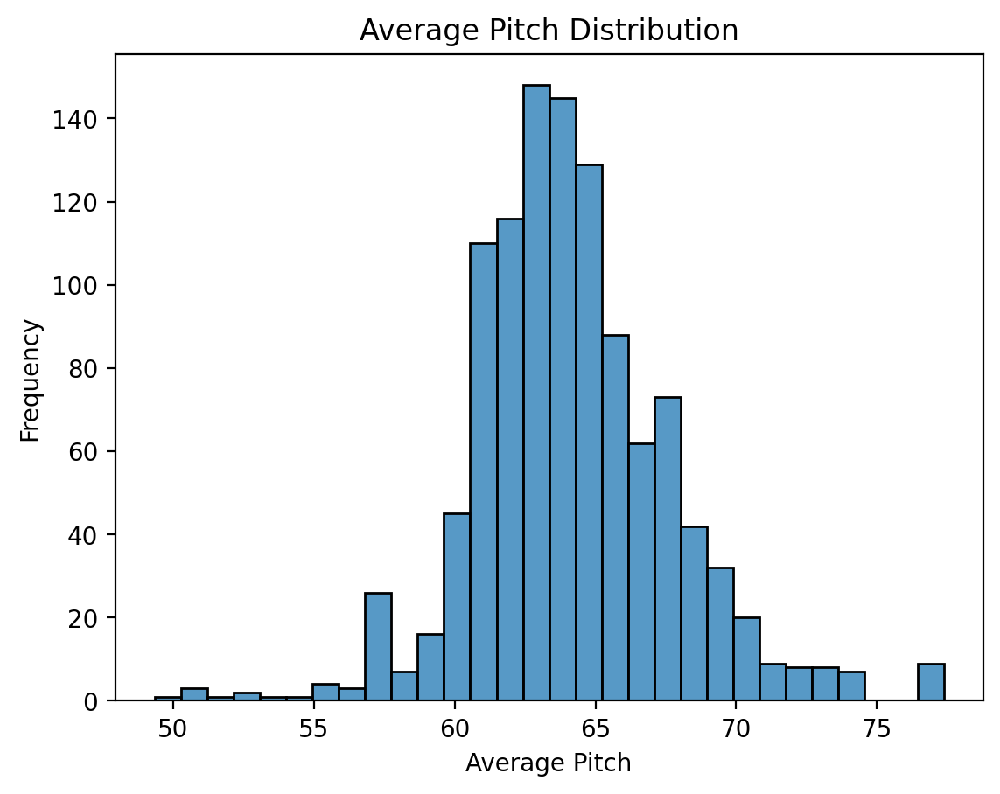

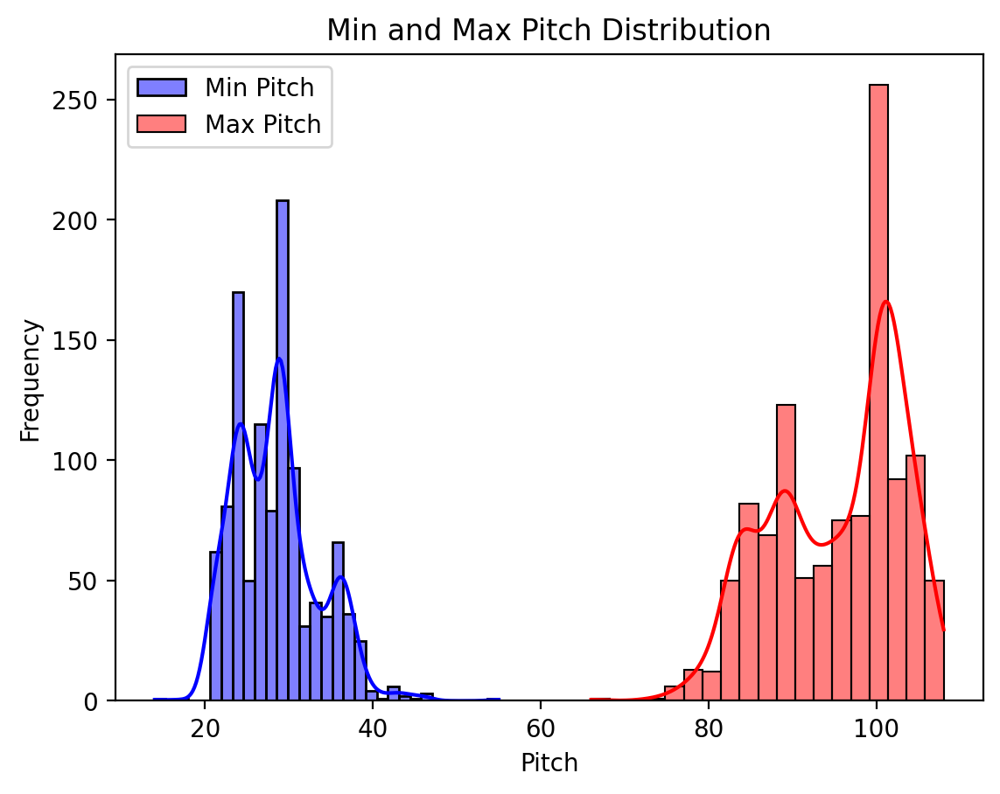

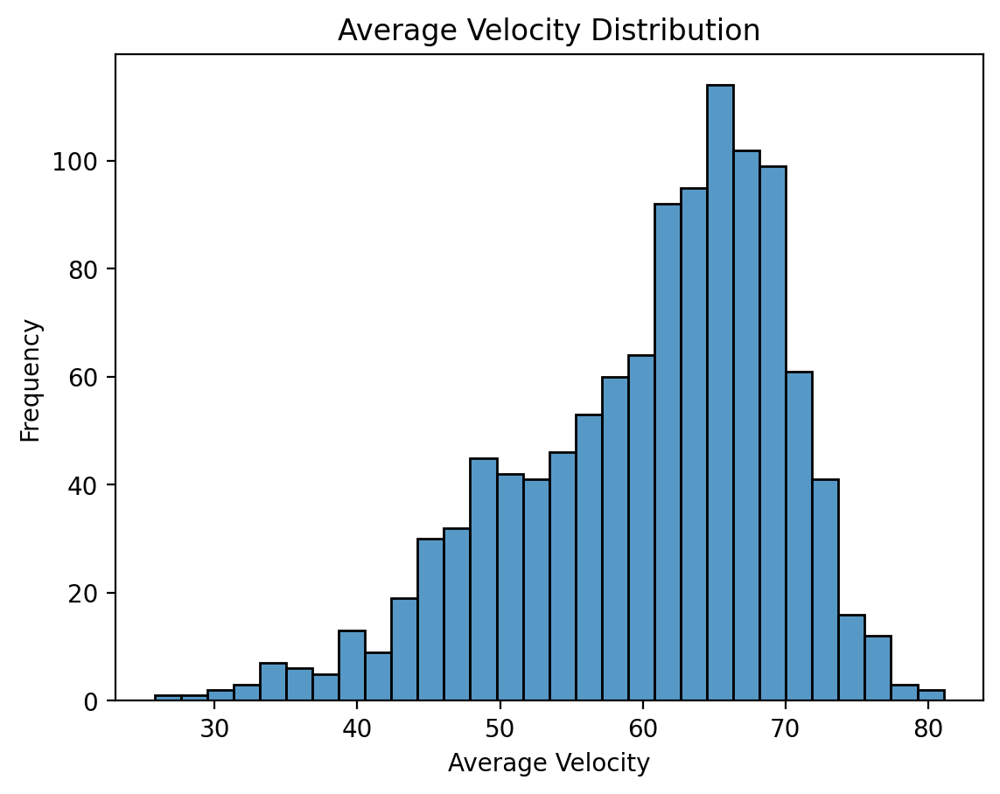

In [ ]:
# Average Pitch Distribution
sns.histplot(midi_data['avg_pitch'], bins=30)
plt.title('Average Pitch Distribution')
plt.xlabel('Average Pitch')
plt.ylabel('Frequency')
plt.show()

# Min and Max Pitch Distribution
sns.histplot(midi_data['min_pitch'], color='blue', label='Min Pitch', kde=True)
sns.histplot(midi_data['max_pitch'], color='red', label='Max Pitch', kde=True)
plt.legend()
plt.title('Min and Max Pitch Distribution')
plt.xlabel('Pitch')
plt.ylabel('Frequency')
plt.show()

# Average Velocity Distribution
sns.histplot(midi_data['avg_velocity'], bins=30)
plt.title('Average Velocity Distribution')
plt.xlabel('Average Velocity')
plt.ylabel('Frequency')
plt.show()


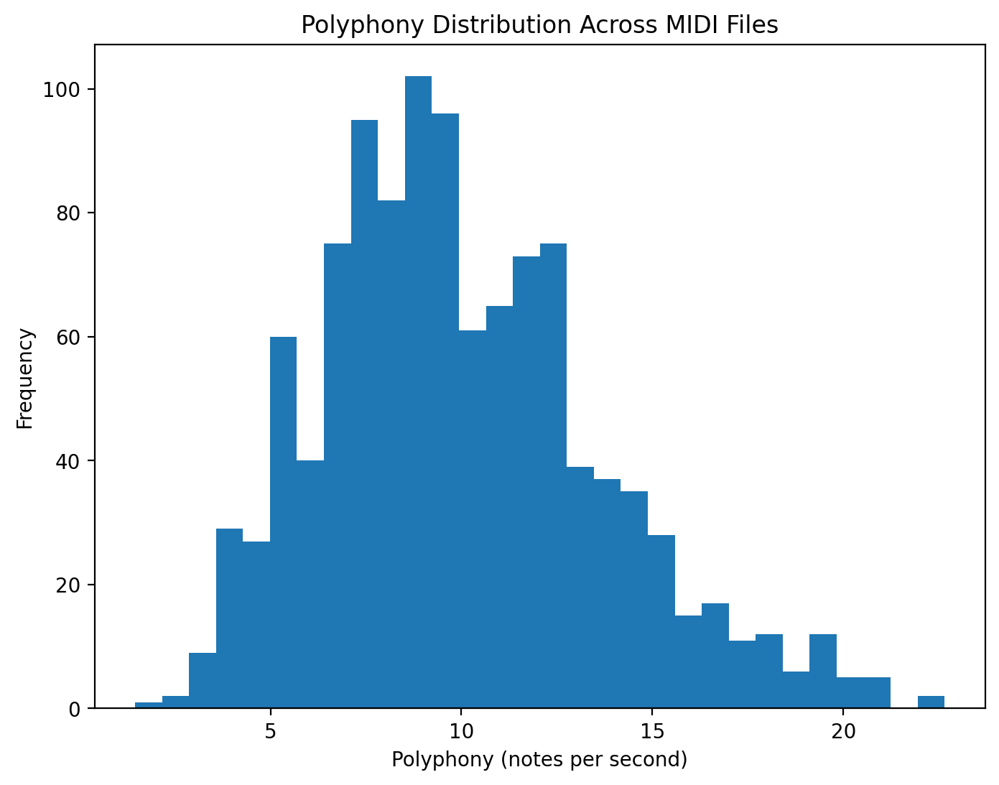

In [ ]:
# Plotting the distribution of polyphony
plt.figure(figsize=(8, 6))
plt.hist(midi_data['polyphony'], bins=30)
plt.title('Polyphony Distribution Across MIDI Files')
plt.xlabel('Polyphony (notes per second)')
plt.ylabel('Frequency')
plt.show()

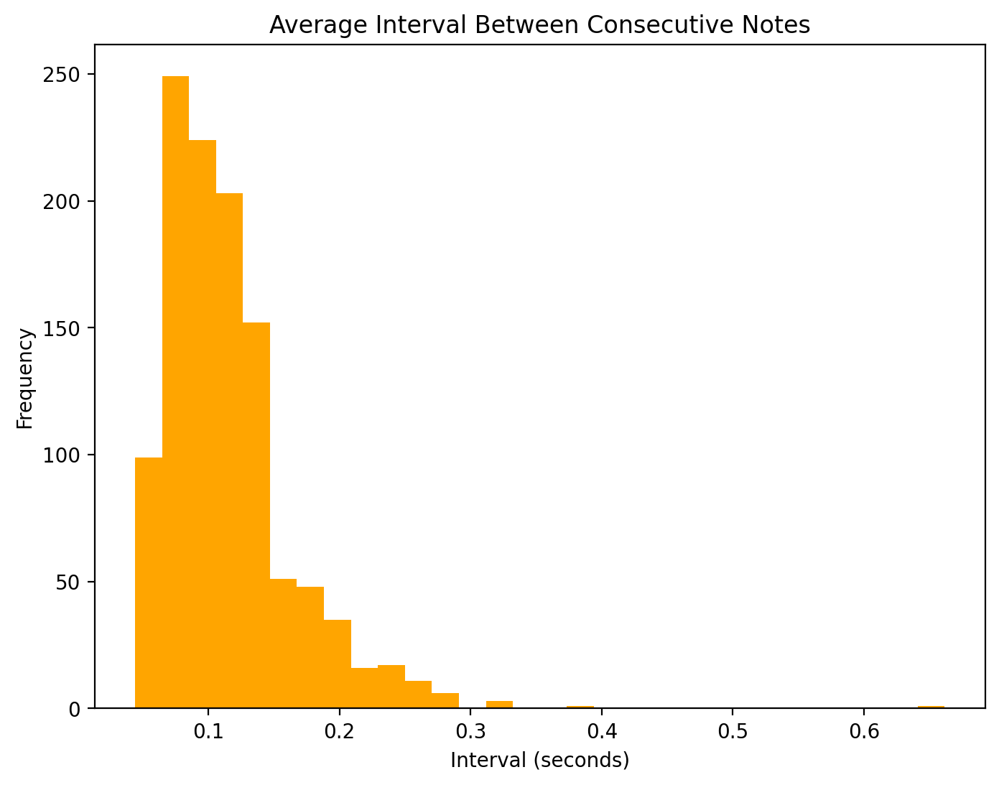

In [ ]:
# Plotting the average interval between consecutive notes
plt.figure(figsize=(8, 6))
plt.hist(midi_data['avg_interval'], bins=30, color='orange')
plt.title('Average Interval Between Consecutive Notes')
plt.xlabel('Interval (seconds)')
plt.ylabel('Frequency')
plt.show()


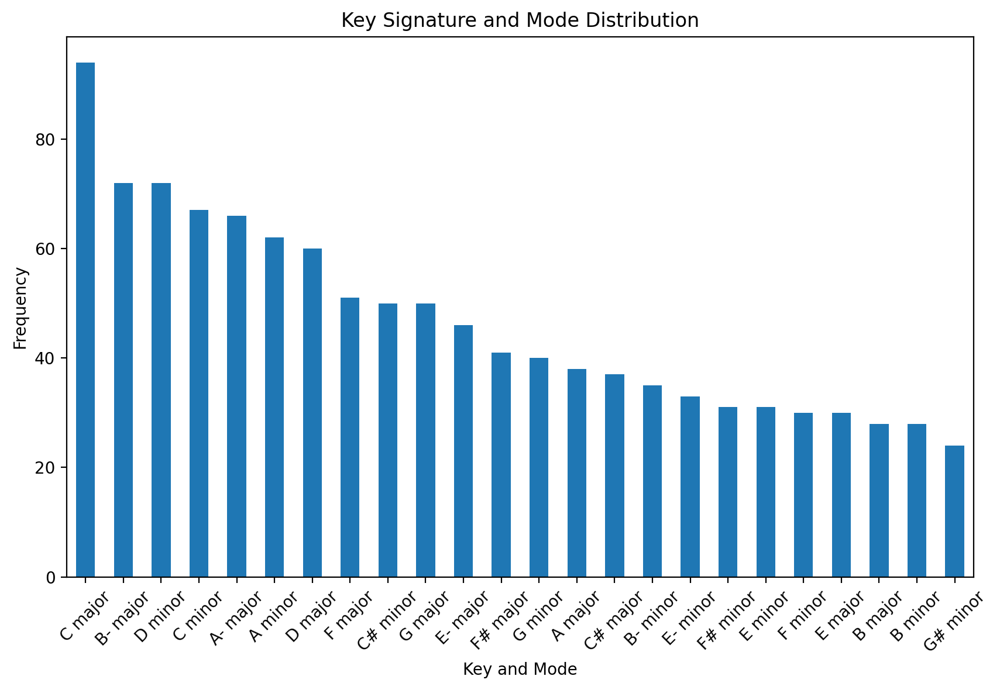

main_key
C major     94
B- major    72
D minor     72
C minor     67
A- major    66
A minor     62
D major     60
F major     51
C# minor    50
G major     50
E- major    46
F# major    41
G minor     40
A major     38
C# major    37
B- minor    35
E- minor    33
F# minor    31
E minor     31
F minor     30
E major     30
B major     28
B minor     28
G# minor    24
Name: count, dtype: int64
1116


In [ ]:
# Extracting key signatures and modes
keys = midi_data['main_key'].value_counts()

# Plotting
keys.plot(kind='bar', figsize=(10, 6))
plt.title('Key Signature and Mode Distribution')
plt.xlabel('Key and Mode')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Extracting key signatures and modes
keys = midi_data['main_key'].value_counts()

print(keys)
print(sum(keys))


In [ ]:
from collections import Counter

# Assuming `chords` column contains strings of unique chords separated by commas
midi_data['chord_list'] = midi_data['chords'].apply(lambda x: x.split(', '))

# Chord Frequency Distribution
all_chords = [chord for sublist in midi_data['chord_list'] for chord in sublist]
chord_counts = Counter(all_chords)
most_common_chords = chord_counts.most_common(10)  # Adjust as needed

# Plotting the most common chords
plt.figure(figsize=(10, 6))
plt.bar([chord[0] for chord in most_common_chords], [chord[1] for chord in most_common_chords])
plt.xlabel('Chord')
plt.ylabel('Frequency')
plt.title('Top 10 Most Common Chords')
plt.show()

# Chord Diversity per Piece
midi_data['unique_chords_count'] = midi_data['chord_list'].apply(len)
plt.figure(figsize=(10, 6))
midi_data['unique_chords_count'].hist(bins=20)
plt.xlabel('Number of Unique Chords')
plt.ylabel('Number of Pieces')
plt.title('Distribution of Unique Chords per Piece')
plt.show()

AttributeError: 'float' object has no attribute 'split'

In [ ]:
def plot_descriptive_statistics(data):
    desc_stats = data.describe().transpose()
    print(desc_stats[['mean', 'std', '50%', 'min', 'max']])

    # Conclusions can be drawn by observing the mean, standard deviation, and median values to understand the central tendency
    # and dispersion of the data. Min and max values help id

In [ ]:
plot_descriptive_statistics(midi_data)

                       mean         std         50%        min          max
num_instruments    1.228495    0.420051    1.000000   1.000000     2.000000
duration         532.230350  465.490722  374.646094  23.343477  3752.264323
tempo_changes    195.607527  505.454005    1.000000   1.000000  5758.000000
key_signatures     0.521505    1.375795    0.000000   0.000000    16.000000
time_signatures    1.250896    1.557781    1.000000   1.000000    23.000000
avg_pitch         64.158214    3.543467   63.876476  49.343878    77.367489
min_pitch         28.419355    4.959363   28.000000  14.000000    55.000000
max_pitch         95.383513    7.758337   97.000000  66.000000   108.000000
avg_velocity      60.404364    9.334229   62.502621  25.805295    81.079620
avg_duration       0.263991    0.172737    0.216633   0.053905     1.585737
polyphony          9.986898    3.656005    9.444468   1.454365    22.653127
avg_interval       0.114116    0.049434    0.104908   0.044075     0.661615


In [ ]:
def plot_correlations(data):

    corr = data.select_dtypes(include=['float64', 'int64']).corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
    plt.title('Correlation Matrix')

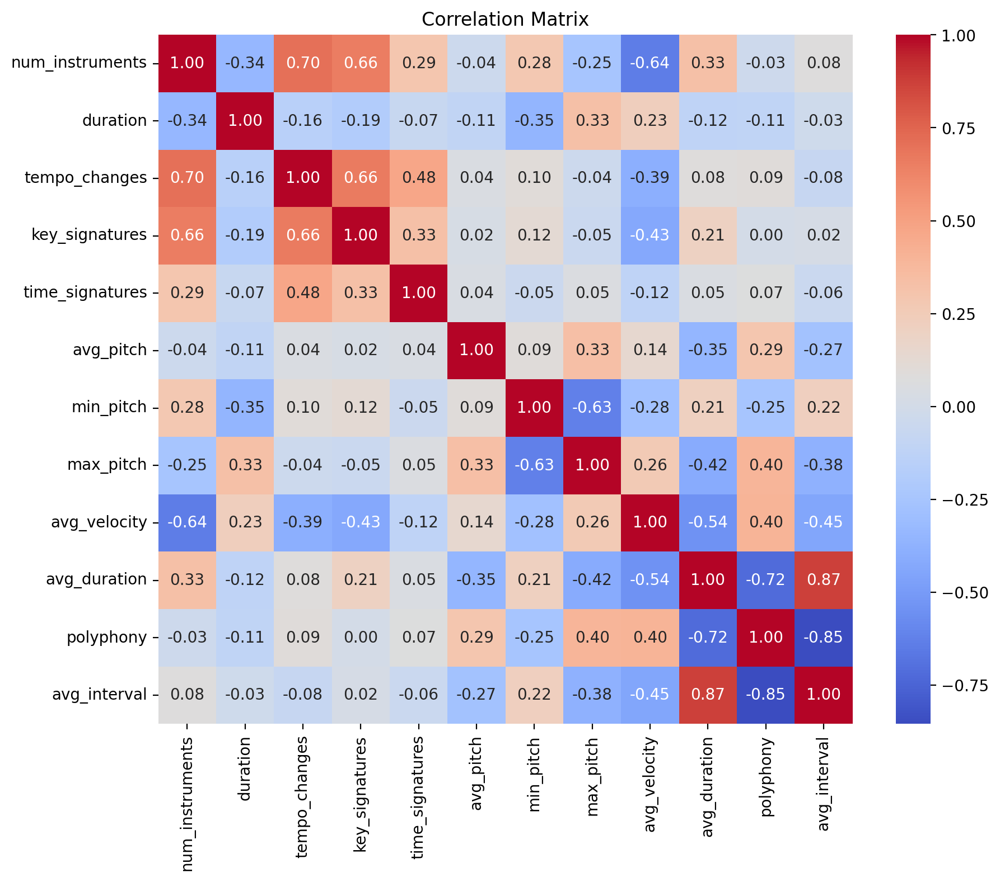

In [ ]:
plot_correlations(midi_data)

In [ ]:
#Extract all notes_v2 from the midi_dataset
Corpus = midi_data['notes_v2'].tolist()

In [ ]:
def split_corpus(corpus):
    split_corpus = []
    for item in corpus:
        split_items = item.split()  # Split each string by spaces to preserve full notes
        split_corpus.extend(split_items)  # Add the split items to the new list
    return split_corpus

Corpus = split_corpus(Corpus)

In [ ]:
print(len(Corpus))

3129148


In [ ]:
print("First 200 Notes of the Corpus", Corpus[:200])

First 200 Notes of the Corpus ['D2', 'A3', 'D4', 'A4', 'D4', 'A3', 'F#3', 'A2', 'F#3', 'A2', 'D4', 'D2', 'A3', 'D4', 'A4', 'D4', 'A3', 'F#3', 'A2', 'D4', 'A4', 'F#4', 'D2', 'A3', 'A4', 'D4', 'A3', 'E4', 'C#4', 'F#4', '7.9', 'A3', 'F#4', 'D4', 'D3', 'A3', 'A4', 'D4', 'B3', 'A3', '9.2', 'F#4', 'A3', 'C#4', 'D2', 'A3', '7.9', 'B3', '9.2', 'E4', 'D4', 'A3', 'E4', 'A3', 'A4', 'D4', 'D3', 'B3', 'C#4', 'C#4', 'A3', '7.9', 'A3', 'F#4', 'C#4', '9.0', 'D5', 'E4', 'D3', 'G4', 'B3', 'B3', 'D5', 'D2', 'F#4', 'D4', 'F#4', 'B3', 'D4', 'G4', 'B-3', 'B3', 'G4', 'D5', 'D3', 'B3', 'D5', 'D4', 'B3', 'D4', 'G3', 'G4', 'B3', 'F#3', 'G3', 'G3', 'B3', 'B4', 'B3', 'E4', 'D2', 'D4', 'G3', 'B3', '0.6', '9.2', 'E4', 'G4', 'G3', 'C5', 'B3', 'F#4', 'D3', 'E4', 'B3', 'D5', 'D4', 'B3', 'G#4', 'F4', 'B3', '2.5', 'G4', 'A3', '9.1', 'C#4', 'C#5', 'F#4', 'C#4', 'F#4', 'A4', 'F#1', 'G#4', 'A3', 'G#4', 'F#4', '2.5', 'B3', 'D5', 'A3', 'F4', 'C#4', 'A4', 'F#2', 'C#3', 'F#4', 'A4', 'A3', 'C#4', 'C#5', 'F#4', 'A3', '10.2', '2.

In [ ]:
#Creating a count dictionary
count_num = Counter(Corpus)
print("Total unique notes in the Corpus:", len(count_num))

Total unique notes in the Corpus: 2942


In [ ]:
rare_note = []
for index, (key, value) in enumerate(count_num.items()):
    if value < 500:
        m =  key
        rare_note.append(m)
print("Total number of notes that occur less than 500 times:", len(rare_note))

Total number of notes that occur less than 500 times: 2487


In [ ]:
# Initialize the counter
deleted_count = 0

# Eliminating the rare notes
for element in list(Corpus):  # Using list(Corpus) to avoid modifying the list while iterating
    if element in rare_note:
        Corpus.remove(element)
        deleted_count += 1  # Increment the counter for each deletion
        print(f"Deleted note: {element}")

# Print the number of deleted notes
print("Total number of rare notes deleted:", deleted_count)

# Print the length of Corpus after deletion
print("Length of Corpus after eliminating the rare notes:", len(Corpus))


Streaming output truncated to the last 5000 lines.
Deleted note: 2.4.6.9.10
Deleted note: 2.4.6.8.9.11
Deleted note: 8.11.1.2.4
Deleted note: 8.11.0.2.4
Deleted note: 8.10.11.2.4
Deleted note: 2.4.5.6.7.9
Deleted note: 9.11.0.2.4.5
Deleted note: 4.5.7.9.11.0
Deleted note: 2.4.5.7.9
Deleted note: 11.0.2.4.5
Deleted note: 9.11.1.3.4
Deleted note: 6.8.10.0.3
Deleted note: 6.8.10.0.3
Deleted note: 8.11.0.1.2
Deleted note: 5.6.8.11
Deleted note: 8.10.11.2
Deleted note: 4.7.8.11
Deleted note: 11.0.1.2.5
Deleted note: 11.2.5.6.7
Deleted note: 11.2.3.4.7
Deleted note: 8.11.0.2
Deleted note: 10.11.2.5
Deleted note: 11.2.4.5.6
Deleted note: 8.10.11.2
Deleted note: 6.9.0.1
Deleted note: 9.0.1.4
Deleted note: 9.11.2.3.5
Deleted note: 5.8.11.1.2
Deleted note: 11.0.1.5
Deleted note: 11.1.3.5.8
Deleted note: 0.1.2.4
Deleted note: 5.8.11.1.2
Deleted note: 9.10.1.4
Deleted note: 7.9.10.1.3
Deleted note: 7.9.10.1.3
Deleted note: 10.1.3.6.7
Deleted note: 7.10.1.3.4
Deleted note: 3.4.7.10
Deleted note: 3.

In [ ]:
#Creating a count dictionary
count_num = Counter(Corpus)
print("Total unique notes in the Corpus:", len(count_num))

Total unique notes in the Corpus: 455


In [ ]:
#Exploring the notes dictionary
Notes = list(count_num.keys())
Recurrence = list(count_num.values())
#Average recurrenc for a note in Corpus
def Average(lst):
    return sum(lst) / len(lst)
print("Average recurrency for a note in Corpus:", Average(Recurrence))
print("Most frequent note in Corpus appeared:", max(Recurrence), "times")
print("Least frequent note in Corpus appeared:", min(Recurrence), "time")

Average recurrency for a note in Corpus: 6713.331868131868
Most frequent note in Corpus appeared: 47515 times
Least frequent note in Corpus appeared: 300 time


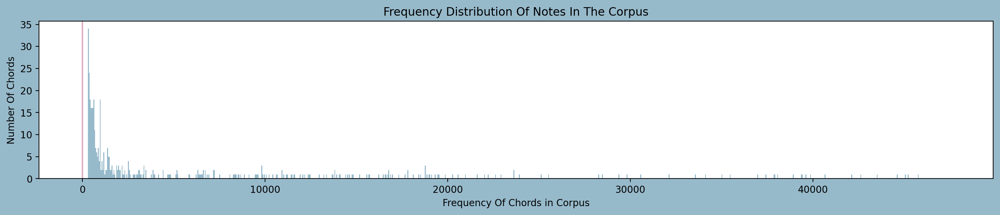

In [ ]:
# Plotting the distribution of Notes
plt.figure(figsize=(18,3),facecolor="#97BACB")
bins = np.arange(0,(max(Recurrence)), 50)
plt.hist(Recurrence, bins=bins, color="#97BACB")
plt.axvline(x=10,color="#DBACC1")
plt.title("Frequency Distribution Of Notes In The Corpus")
plt.xlabel("Frequency Of Chords in Corpus")
plt.ylabel("Number Of Chords")
plt.show()

# Encoding

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

# Extract notes from the notes_v2 column
notes = midi_data['notes_v2'].str.split().sum()

#extract only 25 % of notes
notes = notes[:int(len(notes)*0.40)]


# Storing all the unique characters present in my corpus to bult a mapping dic.
unique_notes = sorted(list(set(notes)))

corpus_length = len(notes) #length of corpus
unique_notes_length = len(unique_notes) #length of total unique characters

#Building dictionary to access the vocabulary from indices and vice versa
mapping = dict((c, i) for i, c in enumerate(unique_notes))
reverse_mapping = dict((i, c) for i, c in enumerate(unique_notes))

print(len(notes))
print("Total number of characters",corpus_length)
print("Total number of unique characters", unique_notes_length)

1251659
Total number of characters 1251659
Total number of unique characters 2567


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

# Storing all the unique characters present in my corpus to bult a mapping dic.
symb = sorted(list(set(Corpus)))

L_corpus = len(Corpus) #length of corpus
L_symb = len(symb) #length of total unique characters

#Building dictionary to access the vocabulary from indices and vice versa
mapping = dict((c, i) for i, c in enumerate(symb))
reverse_mapping = dict((i, c) for i, c in enumerate(symb))

print("Total number of characters:", L_corpus)
print("Number of unique characters:", L_symb)

Total number of characters: 1069098
Number of unique characters: 455


In [ ]:
print("First 300 Notes of the Corpus", Corpus[:300])

First 300 Notes of the Corpus ['D2', 'A3', 'D4', 'A4', 'D4', 'A3', 'F#3', 'A2', 'F#3', 'A2', 'D4', 'D2', 'A3', 'D4', 'A4', 'D4', 'A3', 'F#3', 'A2', 'D4', 'A4', 'F#4', 'D2', 'A3', 'A4', 'D4', 'A3', 'E4', 'C#4', 'F#4', '7.9', 'A3', 'F#4', 'D4', 'D3', 'A3', 'A4', 'D4', 'B3', 'A3', '9.2', 'F#4', 'A3', 'C#4', 'D2', 'A3', '7.9', 'B3', '9.2', 'E4', 'D4', 'A3', 'E4', 'A3', 'A4', 'D4', 'D3', 'B3', 'C#4', 'C#4', 'A3', '7.9', 'A3', 'F#4', 'C#4', '9.0', 'D5', 'E4', 'D3', 'G4', 'B3', 'B3', 'D5', 'D2', 'F#4', 'D4', 'F#4', 'B3', 'D4', 'G4', 'B-3', 'B3', 'G4', 'D5', 'D3', 'B3', 'D5', 'D4', 'B3', 'D4', 'G3', 'G4', 'B3', 'F#3', 'G3', 'G3', 'B3', 'B4', 'B3', 'E4', 'D2', 'D4', 'G3', 'B3', '0.6', '9.2', 'E4', 'G4', 'G3', 'C5', 'B3', 'F#4', 'D3', 'E4', 'B3', 'D5', 'D4', 'B3', 'G#4', 'F4', 'B3', '2.5', 'G4', 'A3', '9.1', 'C#4', 'C#5', 'F#4', 'C#4', 'F#4', 'A4', 'F#1', 'G#4', 'A3', 'G#4', 'F#4', '2.5', 'B3', 'D5', 'A3', 'F4', 'C#4', 'A4', 'F#2', 'C#3', 'F#4', 'A4', 'A3', 'C#4', 'C#5', 'F#4', 'A3', '10.2', '2.

In [ ]:
print(len(Corpus))

3054566


In [ ]:
#lets try with 35% of the corpus
Corpus = Corpus[:int(len(Corpus)*0.30)]
print("First 300 Notes of the Corpus", Corpus[:300])

First 300 Notes of the Corpus ['D2', 'A3', 'D4', 'A4', 'D4', 'A3', 'F#3', 'A2', 'F#3', 'A2', 'D4', 'D2', 'A3', 'D4', 'A4', 'D4', 'A3', 'F#3', 'A2', 'D4', 'A4', 'F#4', 'D2', 'A3', 'A4', 'D4', 'A3', 'E4', 'C#4', 'F#4', '7.9', 'A3', 'F#4', 'D4', 'D3', 'A3', 'A4', 'D4', 'B3', 'A3', '9.2', 'F#4', 'A3', 'C#4', 'D2', 'A3', '7.9', 'B3', '9.2', 'E4', 'D4', 'A3', 'E4', 'A3', 'A4', 'D4', 'D3', 'B3', 'C#4', 'C#4', 'A3', '7.9', 'A3', 'F#4', 'C#4', '9.0', 'D5', 'E4', 'D3', 'G4', 'B3', 'B3', 'D5', 'D2', 'F#4', 'D4', 'F#4', 'B3', 'D4', 'G4', 'B-3', 'B3', 'G4', 'D5', 'D3', 'B3', 'D5', 'D4', 'B3', 'D4', 'G3', 'G4', 'B3', 'F#3', 'G3', 'G3', 'B3', 'B4', 'B3', 'E4', 'D2', 'D4', 'G3', 'B3', '0.6', '9.2', 'E4', 'G4', 'G3', 'C5', 'B3', 'F#4', 'D3', 'E4', 'B3', 'D5', 'D4', 'B3', 'G#4', 'F4', 'B3', '2.5', 'G4', 'A3', '9.1', 'C#4', 'C#5', 'F#4', 'C#4', 'F#4', 'A4', 'F#1', 'G#4', 'A3', 'G#4', 'F#4', '2.5', 'B3', 'D5', 'A3', 'F4', 'C#4', 'A4', 'F#2', 'C#3', 'F#4', 'A4', 'A3', 'C#4', 'C#5', 'F#4', 'A3', '10.2', '2.

In [ ]:
print(len(Corpus))

1069098


In [ ]:
#Splitting the Corpus in equal length of strings and output target
length = 40
features = []
targets = []
for i in range(0, L_corpus - length, 1):
    feature = Corpus[i:i + length]
    target = Corpus[i + length]
    features.append([mapping[j] for j in feature])
    targets.append(mapping[target])


L_datapoints = len(targets)
print("Total number of sequences in the Corpus:", L_datapoints)

Total number of sequences in the Corpus: 1069058


In [ ]:
!pip install tensorflow

In [ ]:
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adamax

# reshape X and normalize
X = (np.reshape(features, (L_datapoints, length, 1)))/ float(L_symb)
# one hot encode the output variable
y = tensorflow.keras.utils.to_categorical(targets)

In [ ]:
#Taking out a subset of data to be used as seed
X_train, X_seed, y_train, y_seed = train_test_split(X, y, test_size=0.2, random_state=42)

# LSTM

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adamax
#MODEL

#Initialising the Model
model = Sequential()
#Adding layers
model.add(LSTM(512, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Dropout(0.1))
model.add(LSTM(256))
model.add(Dense(256))
model.add(Dropout(0.1))
model.add(Dense(y.shape[1], activation='softmax'))
#Compiling the model for training
opt = Adamax(learning_rate=0.001)
model.compile(loss='categorical_crossentropy', optimizer=opt)



In [ ]:
#Model's Summary
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 40, 512)           1052672   
                                                                 
 dropout_4 (Dropout)         (None, 40, 512)           0         
                                                                 
 lstm_5 (LSTM)               (None, 256)               787456    
                                                                 
 dense_4 (Dense)             (None, 256)               65792     
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_5 (Dense)             (None, 363)               93291     
                                                                 
Total params: 1999211 (7.63 MB)
Trainable params: 1999

In [ ]:
#Training the model
history = model.fit(X_train, y_train, epochs=200, batch_size=256)

Epoch 1/200
295/295 [==============================] - 6s 9ms/step - loss: 5.2072
Epoch 2/200
295/295 [==============================] - 3s 9ms/step - loss: 5.1361
Epoch 3/200
295/295 [==============================] - 3s 9ms/step - loss: 5.1192
Epoch 4/200
295/295 [==============================] - 2s 8ms/step - loss: 5.1099
Epoch 5/200
295/295 [==============================] - 3s 9ms/step - loss: 5.1025
Epoch 6/200
295/295 [==============================] - 2s 8ms/step - loss: 5.0964
Epoch 7/200
295/295 [==============================] - 2s 8ms/step - loss: 5.0904
Epoch 8/200
295/295 [==============================] - 2s 8ms/step - loss: 5.0843
Epoch 9/200
295/295 [==============================] - 2s 8ms/step - loss: 5.0773
Epoch 10/200
295/295 [==============================] - 2s 8ms/step - loss: 5.0653
Epoch 11/200
295/295 [==============================] - 2s 8ms/step - loss: 5.0499
Epoch 12/200
295/295 [==============================] - 2s 8ms/step - loss: 5.0343
Epoch 13/200


[Text(0.5, 0, 'Epochs')]

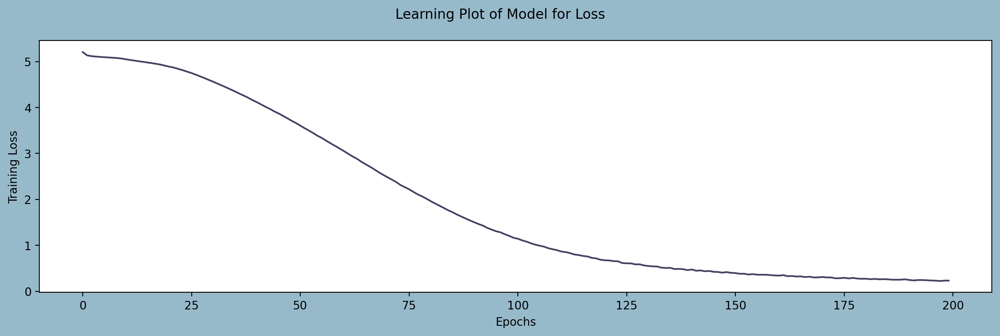

In [ ]:
#Plotting the learnings
history_df = pd.DataFrame(history.history)
fig = plt.figure(figsize=(15,4), facecolor="#97BACB")
fig.suptitle("Learning Plot of Model for Loss")
pl=sns.lineplot(data=history_df["loss"],color="#444160")
pl.set(ylabel ="Training Loss")
pl.set(xlabel ="Epochs")

In [ ]:
loss = model.evaluate(X_seed, y_seed)
print(f'Validation Loss: {loss}')

590/590 [==============================] - 2s 4ms/step - loss: 14.1668
Validation Loss: 14.166818618774414


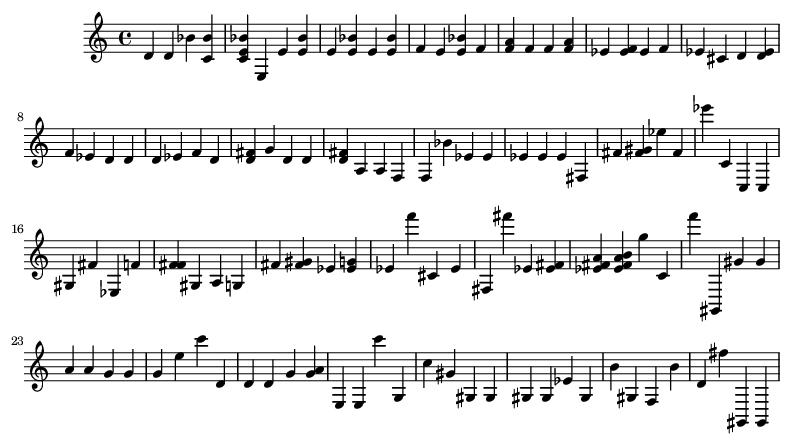

In [ ]:
def Malody_Generator(Note_Count):
    seed = X_seed[np.random.randint(0,len(X_seed)-1)]
    Music = ""
    Notes_Generated=[]
    for i in range(Note_Count):
        seed = seed.reshape(1,length,1)
        prediction = model.predict(seed, verbose=0)[0]
        prediction = np.log(prediction) / 1.0 #diversity
        exp_preds = np.exp(prediction)
        prediction = exp_preds / np.sum(exp_preds)
        index = np.argmax(prediction)
        index_N = index/ float(L_symb)
        Notes_Generated.append(index)
        Music = [reverse_mapping[char] for char in Notes_Generated]
        seed = np.insert(seed[0],len(seed[0]),index_N)
        seed = seed[1:]
    #Now, we have music in form or a list of chords and notes and we want to be a midi file.
    Melody = chords_n_notes(Music)
    Melody_midi = stream.Stream(Melody)
    return Music,Melody_midi,Notes_Generated


#getting the Notes and Melody created by the model
Music_notes, Melody,Notes_Generated = Malody_Generator(100)
show(Melody)

In [ ]:
#To save the generated melody
Melody.write('midi','Melody_Generated_1.mid')

'Melody_Generated_1.mid'

In [ ]:
#to play audio or corpus
print("Sample Audio From Data")
IPython.display.Audio("/content/drive/MyDrive/Tesina/Resultados/model_v2/Melody_Generated_100.wav")

Sample Audio From Data


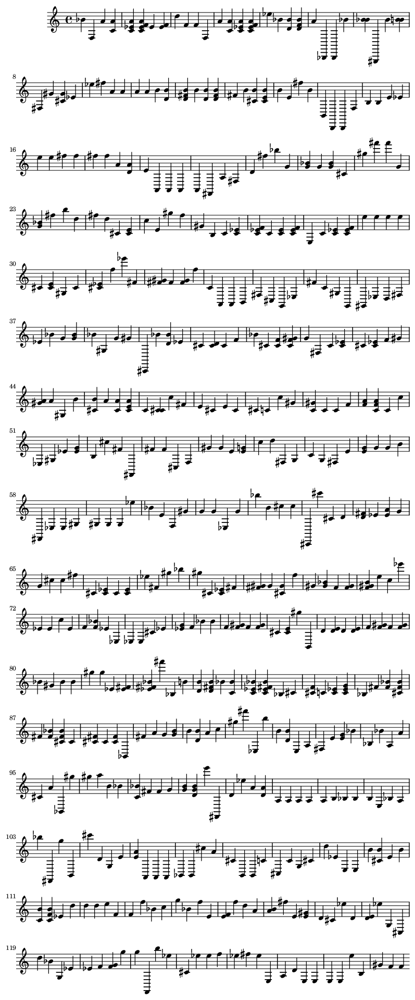

In [ ]:
Music_notes_2, Melody_2,Notes_Generated_2 = Malody_Generator(400)
show(Melody_2)

In [ ]:
#To save the generated melody
Melody_2.write('midi','Melody_Generated_2.mid')

'Melody_Generated_2.mid'

In [ ]:
#to play audio or corpus
print("Sample Audio From Data")
IPython.display.Audio("/content/drive/MyDrive/Tesina/Resultados/model_v2/Melody_Generated_400.wav")

Sample Audio From Data


In [ ]:
print(Music_notes)

['4.9', '4.9', '9.1', 'G#4', 'G#4', '7.9', 'G5', '9.2', '2.6', 'G4', 'A5', 'A5', 'A4', 'G5', 'F#6', '9.1', '6.9.1', 'F#3', 'A2', 'E4', 'C#5', 'G4', 'G4', 'G4', 'G4', 'C3', 'E-4', 'C3', 'G4', 'E-4', 'E-5', '4.9', 'F3', 'C5', 'G5', 'E-4', 'E-4', '5.9', 'D5', 'C#4', '7.11', 'E3', 'C#3', '0.3', 'A4', 'F3', '9', 'E5', 'C4', 'B5', 'C4', 'B4', 'A3', 'F3', 'C5', 'E-4', 'B-4', 'B-4', '4.10', 'E3', 'B3', 'B4', 'B4', 'B4', 'G4', '1.4', 'G#4', 'F#5', 'B5', '7.11.2', 'B-4', 'G2', 'E3', 'G2', 'F4', 'F4', 'F3', 'B-3', '8.11', '1.5.8', 'C#3', 'F3', '3.5', 'G3', 'F4', 'F4', 'G#1', '10.3', 'C#5', 'C#5', 'B5', 'D4', 'D4', 'B3', 'D4', 'D4', 'B3', '11.1', '11.1', '1.7', 'E-4', 'E-4', 'G3', '4.7', 'B4', 'B1', '11.2', '11.2', 'E-4', 'B3', '3.6', '3.6', 'F#4', 'F#4', 'E5', 'D4', 'F#1', '8.11.2.4', 'G3', 'B-2', 'B-3', 'B-3', 'B2', 'B2', 'B3', 'D4', '4.9', '3.7', 'E6', 'G#3', 'B3', 'G#3', 'F#3', '3.6.9', '6.9', 'A3', 'G5', '3.8', 'E-5', 'D5', 'F#2', 'D5', 'D5', 'G#4', 'F3', '4.8', 'G3', 'E2', '4.8', 'B4', 'G#5'

In [ ]:
print(Notes_Generated)

[321, 321, 58, 333, 150, 150, 150, 173, 150, 192, 173, 192, 129, 327, 347, 327, 309, 99, 347, 327, 321, 321, 321, 327, 347, 118, 360, 321, 118, 290, 290, 346, 346, 297, 327, 327, 327, 327, 327, 340, 204, 328, 341, 329, 0, 314, 314, 353, 341, 326, 176, 353, 290, 359, 204, 142, 327, 349, 309, 327, 340, 343, 141, 361, 315, 349, 352, 354, 354, 291, 291, 360, 360, 360, 335, 317, 321, 321, 321, 232, 333, 333, 317, 359, 316, 354, 353, 353, 353, 353, 327, 353, 303, 353, 346, 74, 321, 342, 352, 352]


In [ ]:
print(Notes_Generated_2)

[297, 346, 269, 129, 322, 347, 347, 346, 269, 328, 72, 291, 294, 294, 67, 351, 67, 340, 245, 125, 328, 342, 291, 291, 291, 291, 93, 93, 341, 85, 303, 334, 342, 303, 301, 300, 300, 346, 302, 302, 334, 327, 335, 335, 342, 342, 342, 342, 287, 334, 289, 289, 289, 289, 339, 290, 340, 321, 342, 298, 218, 218, 309, 355, 343, 343, 218, 342, 304, 322, 342, 322, 37, 316, 334, 355, 348, 354, 302, 13, 13, 333, 13, 335, 335, 335, 335, 37, 353, 30, 348, 329, 204, 204, 348, 315, 289, 289, 301, 340, 308, 358, 326, 341, 315, 353, 358, 352, 326, 320, 340, 327, 297, 218, 297, 353, 360, 354, 307, 69, 327, 27, 309, 347, 297, 47, 360, 340, 12, 30, 173, 259, 291, 353, 82, 274, 1, 316, 341, 334, 309, 334, 309, 309, 315, 316, 241, 315, 315, 193, 0, 316, 326, 353, 142, 302, 310, 341, 339, 341, 341, 308, 346, 354, 354, 162, 316, 322, 340, 359, 315, 359, 340, 162, 360, 360, 303, 339, 326, 326, 353, 353, 353, 353, 328, 297, 334, 346, 354, 360, 360, 326, 360, 298, 303, 310, 310, 307, 311, 26, 118, 148, 216, 216, 31

Analyzing note distribution...


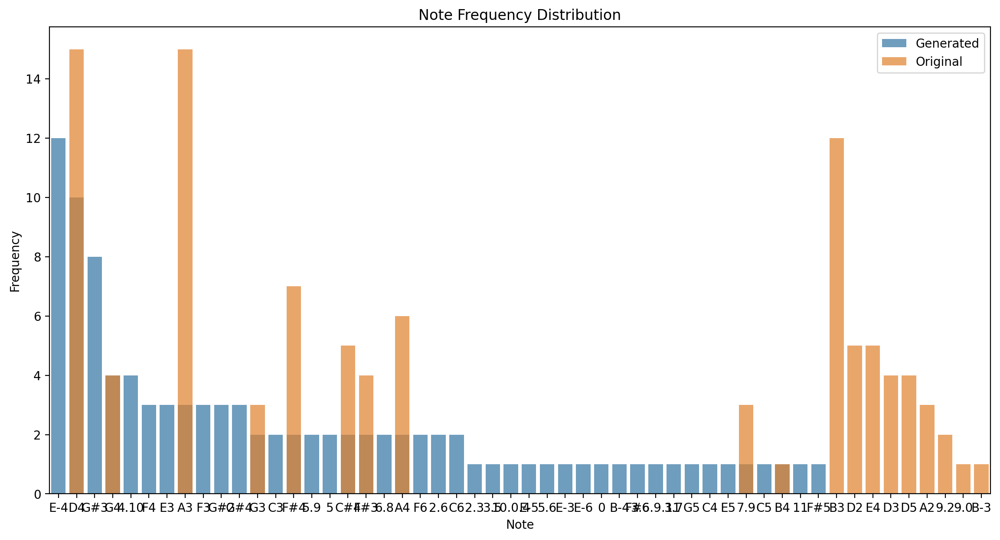

Analyzing interval distribution...


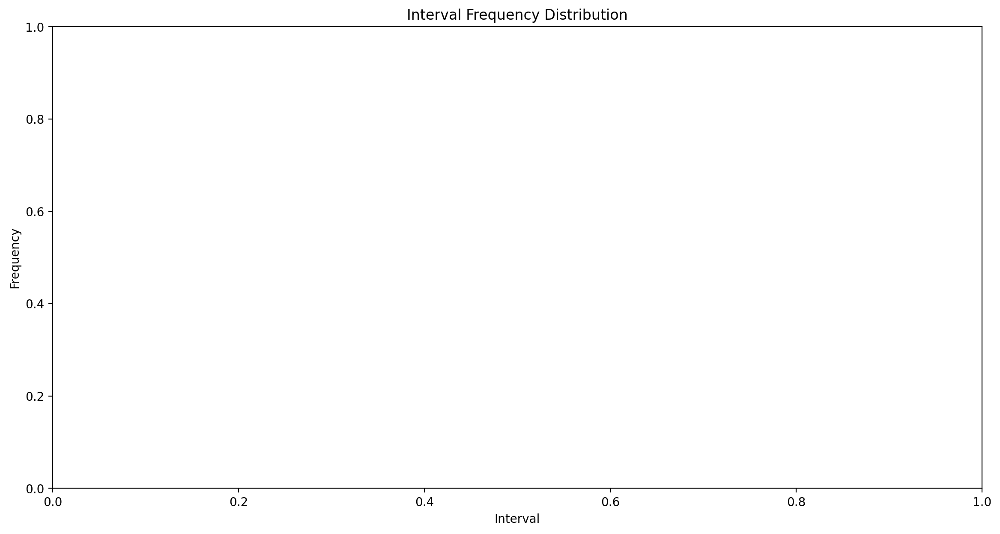

Analyzing harmonic structure...


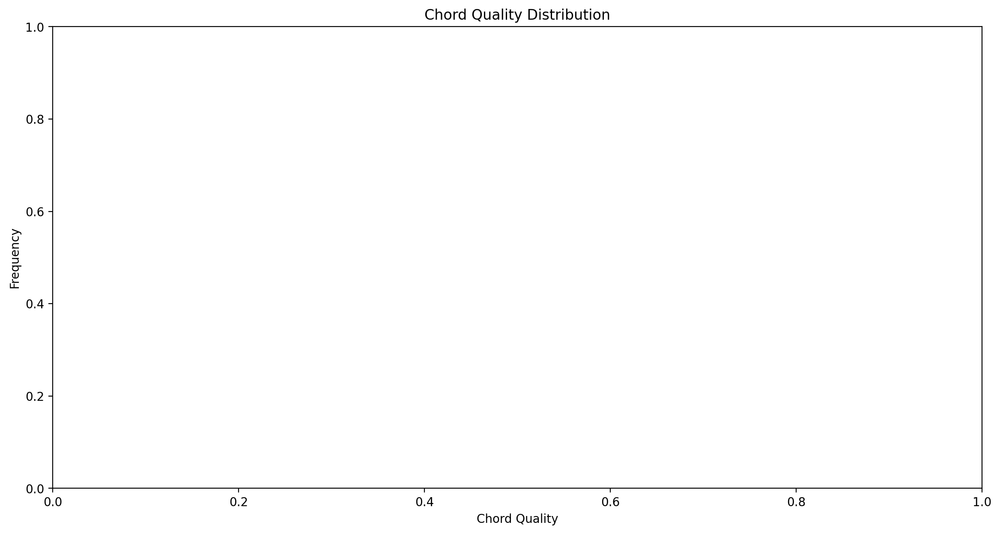

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from music21 import interval, chord

# Function to analyze note distribution
def analyze_note_distribution(generated_notes, original_notes):
    generated_note_counts = pd.Series(generated_notes).value_counts()
    original_note_counts = pd.Series(original_notes).value_counts()

    plt.figure(figsize=(14, 7))
    sns.barplot(x=generated_note_counts.index, y=generated_note_counts.values, alpha=0.7, label='Generated')
    sns.barplot(x=original_note_counts.index, y=original_note_counts.values, alpha=0.7, label='Original')
    plt.title('Note Frequency Distribution')
    plt.xlabel('Note')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

# Function to analyze intervals
def analyze_intervals(generated_notes):
    intervals = []
    for i in range(1, len(generated_notes)):
        note1 = generated_notes[i - 1]
        note2 = generated_notes[i]
        if isinstance(note1, note.Note) and isinstance(note2, note.Note):
            intervals.append(interval.Interval(note1, note2).name)
    interval_counts = pd.Series(intervals).value_counts()

    plt.figure(figsize=(14, 7))
    sns.barplot(x=interval_counts.index, y=interval_counts.values, alpha=0.7)
    plt.title('Interval Frequency Distribution')
    plt.xlabel('Interval')
    plt.ylabel('Frequency')
    plt.show()

# Function to analyze harmonic structure
def analyze_harmonic_structure(generated_notes):
    chords_detected = []
    for n in generated_notes:
        if isinstance(n, chord.Chord):
            chords_detected.append(n.quality)

    chord_counts = pd.Series(chords_detected).value_counts()

    plt.figure(figsize=(14, 7))
    sns.barplot(x=chord_counts.index, y=chord_counts.values, alpha=0.7)
    plt.title('Chord Quality Distribution')
    plt.xlabel('Chord Quality')
    plt.ylabel('Frequency')
    plt.show()

# Main function to evaluate music theory aspects
def evaluate_music_theory(generated_notes, original_notes):
    print("Analyzing note distribution...")
    analyze_note_distribution(generated_notes, original_notes)


evaluate_music_theory(Music_notes, Corpus[:100])


Analyzing note distribution...


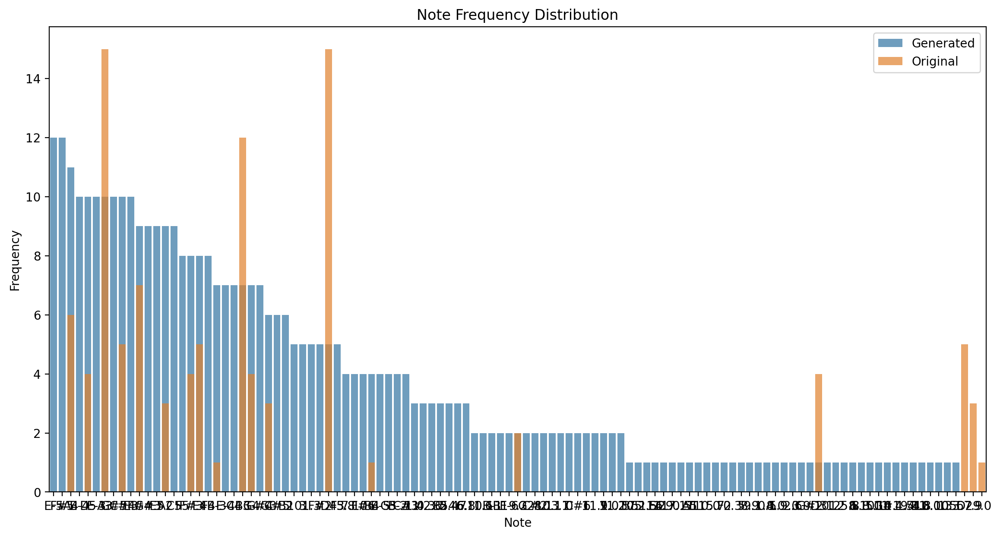

In [ ]:
evaluate_music_theory(Music_notes_2, Corpus[:100])

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import entropy
from music21 import note, interval, chord

# Function to convert string notes to music21 note and chord objects
def convert_to_music21_notes(note_list):
    music21_notes = []
    for n in note_list:
        try:
            if '.' in n or n.isdigit():
                notes = n.split('.')
                notes = [note.Note(int(n)) for n in notes]
                new_chord = chord.Chord(notes)
                music21_notes.append(new_chord)
            else:
                music21_notes.append(note.Note(n))
        except:
            pass
    return music21_notes

# Function to analyze note distribution
def analyze_note_distribution(generated_notes, original_notes):
    generated_note_counts = pd.Series(generated_notes).value_counts(normalize=True)
    original_note_counts = pd.Series(original_notes).value_counts(normalize=True)

    # Fill missing notes with 0 frequency
    all_notes = set(generated_note_counts.index).union(set(original_note_counts.index))
    generated_note_counts = generated_note_counts.reindex(all_notes, fill_value=0)
    original_note_counts = original_note_counts.reindex(all_notes, fill_value=0)

    # Calculate Kullback-Leibler divergence
    kl_divergence = entropy(generated_note_counts, original_note_counts)

    return kl_divergence

# Function to analyze intervals
def analyze_intervals(note_list):
    intervals = []
    for i in range(1, len(note_list)):
        note1 = note_list[i - 1]
        note2 = note_list[i]
        if isinstance(note1, note.Note) and isinstance(note2, note.Note):
            intervals.append(interval.Interval(note1, note2).name)
    return intervals

# Function to calculate interval similarity
def calculate_interval_similarity(generated_intervals, original_intervals):
    generated_interval_counts = pd.Series(generated_intervals).value_counts(normalize=True)
    original_interval_counts = pd.Series(original_intervals).value_counts(normalize=True)

    # Fill missing intervals with 0 frequency
    all_intervals = set(generated_interval_counts.index).union(set(original_interval_counts.index))
    generated_interval_counts = generated_interval_counts.reindex(all_intervals, fill_value=0)
    original_interval_counts = original_interval_counts.reindex(all_intervals, fill_value=0)

    # Calculate Kullback-Leibler divergence
    kl_divergence = entropy(generated_interval_counts, original_interval_counts)

    return kl_divergence

# Function to analyze harmonic structure
def analyze_harmonic_structure(note_list):
    chords_detected = []
    for n in note_list:
        if isinstance(n, chord.Chord):
            chords_detected.append(n.quality)
    return chords_detected

# Function to calculate harmonic quality
def calculate_harmonic_quality(generated_chords):
    # Basic scoring of harmonic quality: higher score for more common chord qualities
    chord_quality_scores = {
        'major': 1.0,
        'minor': 1.0,
        'diminished': 0.5,
        'augmented': 0.5,
        'dominant-seventh': 1.0,
        'minor-seventh': 0.8,
        'major-seventh': 0.8,
        'diminished-seventh': 0.5,
        'augmented-seventh': 0.5
    }

    scores = [chord_quality_scores.get(chord, 0.2) for chord in generated_chords]
    average_score = np.mean(scores)

    return average_score

# Main function to rank generated music based on music theory
def rank_generated_music(generated_notes, original_notes):
    # Convert notes to music21 objects
    generated_notes_music21 = convert_to_music21_notes(generated_notes)
    original_notes_music21 = convert_to_music21_notes(original_notes)

    # Analyze note distribution
    note_distribution_score = analyze_note_distribution(generated_notes, original_notes)

    # Analyze intervals
    generated_intervals = analyze_intervals(generated_notes_music21)
    original_intervals = analyze_intervals(original_notes_music21)
    interval_similarity_score = calculate_interval_similarity(generated_intervals, original_intervals)

    # Analyze harmonic structure
    generated_chords = analyze_harmonic_structure(generated_notes_music21)
    harmonic_quality_score = calculate_harmonic_quality(generated_chords)

    # Combine scores into a final ranking (lower is better for divergence, higher is better for quality)
    final_score = 1 / (1 + note_distribution_score) + 1 / (1 + interval_similarity_score) + harmonic_quality_score

    return final_score


ranking_score = rank_generated_music(Music_notes, Corpus[:100])
print(f"Music Theory Ranking Score: {ranking_score:.2f}")

Music Theory Ranking Score: 0.47


A score of 0.47 indicates a moderate level of alignment with music theory principles, based on the criteria used.

In [ ]:
ranking_score = rank_generated_music(Music_notes_2, Corpus[:100])
print(f"Music Theory Ranking Score: {ranking_score:.2f}")

Music Theory Ranking Score: 0.46


In [ ]:
#save model
model.save('results/model_v2')

In [ ]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To login, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) Y
Token is valid (permission: write).
Cannot authenticate through git-credential as no helper is defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub.
Run the following command in your terminal in 

In [ ]:
from huggingface_hub import HfApi
api = HfApi()

# Modificalo para que sea tu repositorio
api.upload_folder(
    folder_path="results/model_v2", # Modelo a guardar
    repo_id="SantiagoPG/music_gen_v2", # Repositorio
    repo_type="model", # Tipo de repositorio, en nuestro caso modelo
    #path_in_repo="model1", # Carpeta para guardar el modelo
)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


fingerprint.pb:   0%|          | 0.00/56.0 [00:00<?, ?B/s]

variables.data-00000-of-00001:   0%|          | 0.00/24.0M [00:00<?, ?B/s]

keras_metadata.pb:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

Upload 4 LFS files:   0%|          | 0/4 [00:00<?, ?it/s]

saved_model.pb:   0%|          | 0.00/1.30M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/SantiagoPG/music_gen_v2/commit/2e5419733e45363377fd7ef1b409d4ce51cbcdda', commit_message='Upload folder using huggingface_hub', commit_description='', oid='2e5419733e45363377fd7ef1b409d4ce51cbcdda', pr_url=None, pr_revision=None, pr_num=None)

## Model v3

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adamax

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional, LayerNormalization
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dropout, LayerNormalization, Dense
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adamax, Adam



# Define the LSTM model
model = Sequential()

# Adding layers
model.add(Bidirectional(LSTM(1024, return_sequences=True), input_shape=(X.shape[1], X.shape[2])))
model.add(Dropout(0.1))
model.add(LayerNormalization())

model.add(Bidirectional(LSTM(1024, return_sequences=True)))
model.add(Dropout(0.1))
model.add(LayerNormalization())

model.add(Bidirectional(LSTM(512, return_sequences=True)))
model.add(Dropout(0.2))
model.add(LayerNormalization())

# Adding more LSTM layers
model.add(Bidirectional(LSTM(512)))
model.add(Dropout(0.1))  # Reduced dropout rate
model.add(LayerNormalization())

# Dense layers
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.005)))
model.add(Dropout(0.1))  # Reduced dropout rate
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.005)))
model.add(Dropout(0.1))  # Reduced dropout rate

# Output layer
model.add(Dense(y.shape[1], activation='softmax'))


# Compiling the model for training
opt = Adamax(learning_rate=0.0005)
model.compile(loss='categorical_crossentropy', optimizer=opt)

# Print the model summary
model.summary()



Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_32 (Bidirect  (None, 40, 2048)          8404992   
 ional)                                                          
                                                                 
 dropout_48 (Dropout)        (None, 40, 2048)          0         
                                                                 
 layer_normalization_32 (La  (None, 40, 2048)          4096      
 yerNormalization)                                               
                                                                 
 bidirectional_33 (Bidirect  (None, 40, 2048)          25174016  
 ional)                                                          
                                                                 
 dropout_49 (Dropout)        (None, 40, 2048)          0         
                                                      

In [ ]:
# Train the model on the entire training data
history = model.fit(X_train, y_train, epochs=200, batch_size=256, validation_data=(X_seed, y_seed))

Epoch 1/200
3341/3341 [==============================] - 270s 77ms/step - loss: 5.7264 - val_loss: 5.1672
Epoch 2/200
3341/3341 [==============================] - 255s 76ms/step - loss: 5.1040 - val_loss: 4.9689
Epoch 3/200
3341/3341 [==============================] - 255s 76ms/step - loss: 4.9059 - val_loss: 4.8026
Epoch 4/200
3341/3341 [==============================] - 255s 76ms/step - loss: 4.7915 - val_loss: 4.7150
Epoch 5/200
3341/3341 [==============================] - 256s 76ms/step - loss: 4.7110 - val_loss: 4.6287
Epoch 6/200
3341/3341 [==============================] - 256s 76ms/step - loss: 4.6519 - val_loss: 4.5785
Epoch 7/200
3341/3341 [==============================] - 256s 77ms/step - loss: 4.6071 - val_loss: 4.5457
Epoch 8/200
3341/3341 [==============================] - 255s 76ms/step - loss: 4.5692 - val_loss: 4.5204
Epoch 9/200
3341/3341 [==============================] - 254s 76ms/step - loss: 4.5386 - val_loss: 4.4937
Epoch 10/200
3341/3341 [======================

In [ ]:
import numpy as np
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.utils import to_categorical
import pandas as pd
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Perform cross-validation on the validation set
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
acc_per_fold = []
loss_per_fold = []
fold_no = 1

for train, test in kfold.split(X_seed, y_seed):
    # Re-load the best model
    model.load_weights('best_model.h5')

    print(f'Evaluating fold {fold_no} ...')
    scores = model.evaluate(X_seed[test], y_seed[test], verbose=0)
    print(f'Score for fold {fold_no}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}%')
    acc_per_fold.append(scores[1] * 100)
    loss_per_fold.append(scores[0])

    fold_no += 1

# Display results
print('Score per fold')
for i in range(0, len(acc_per_fold)):
    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]} - Accuracy: {acc_per_fold[i]}%')
print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)} (+- {np.std(acc_per_fold)})')
print(f'> Loss: {np.mean(loss_per_fold)}')

Evaluating fold 1 ...


TypeError: 'float' object is not subscriptable

In [ ]:
def Melody_Generator(Note_Count):
    seed = X_seed[np.random.randint(0,len(X_seed)-1)]
    Music = ""
    Notes_Generated=[]
    for i in range(Note_Count):
        seed = seed.reshape(1,length,1)
        prediction = model.predict(seed, verbose=0)[0]
        prediction = np.log(prediction) / 1.0 #diversity
        exp_preds = np.exp(prediction)
        prediction = exp_preds / np.sum(exp_preds)
        index = np.argmax(prediction)
        index_N = index/ float(L_symb)
        Notes_Generated.append(index)
        Music = [reverse_mapping[char] for char in Notes_Generated]
        seed = np.insert(seed[0],len(seed[0]),index_N)
        seed = seed[1:]
    #Now, we have music in form or a list of chords and notes and we want to be a midi file.
    Melody = chords_n_notes(Music)
    Melody_midi = stream.Stream(Melody)
    return Music,Melody_midi,Notes_Generated


#getting the Notes and Melody created by the model
Music_notes_v3, Melody_v3,Notes_Generated_v3 = Melody_Generator(100)
show(Melody_v3)

In [ ]:
#Plotting the learnings
history_df = pd.DataFrame(history.history)
fig = plt.figure(figsize=(15,4), facecolor="#97BACB")
fig.suptitle("Learning Plot of Model for Loss")
pl=sns.lineplot(data=history_df["loss"],color="#444160")
pl.set(ylabel ="Training Loss")
pl.set(xlabel ="Epochs")

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from music21 import interval, chord

# Function to analyze note distribution
def analyze_note_distribution(generated_notes, original_notes):
    generated_note_counts = pd.Series(generated_notes).value_counts()
    original_note_counts = pd.Series(original_notes).value_counts()

    plt.figure(figsize=(14, 7))
    sns.barplot(x=generated_note_counts.index, y=generated_note_counts.values, alpha=0.7, label='Generated')
    sns.barplot(x=original_note_counts.index, y=original_note_counts.values, alpha=0.7, label='Original')
    plt.title('Note Frequency Distribution')
    plt.xlabel('Note')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

# Function to analyze intervals
def analyze_intervals(generated_notes):
    intervals = []
    for i in range(1, len(generated_notes)):
        note1 = generated_notes[i - 1]
        note2 = generated_notes[i]
        if isinstance(note1, note.Note) and isinstance(note2, note.Note):
            intervals.append(interval.Interval(note1, note2).name)
    interval_counts = pd.Series(intervals).value_counts()

    plt.figure(figsize=(14, 7))
    sns.barplot(x=interval_counts.index, y=interval_counts.values, alpha=0.7)
    plt.title('Interval Frequency Distribution')
    plt.xlabel('Interval')
    plt.ylabel('Frequency')
    plt.show()

# Function to analyze harmonic structure
def analyze_harmonic_structure(generated_notes):
    chords_detected = []
    for n in generated_notes:
        if isinstance(n, chord.Chord):
            chords_detected.append(n.quality)

    chord_counts = pd.Series(chords_detected).value_counts()

    plt.figure(figsize=(14, 7))
    sns.barplot(x=chord_counts.index, y=chord_counts.values, alpha=0.7)
    plt.title('Chord Quality Distribution')
    plt.xlabel('Chord Quality')
    plt.ylabel('Frequency')
    plt.show()

# Main function to evaluate music theory aspects
def evaluate_music_theory(generated_notes, original_notes):
    print("Analyzing note distribution...")
    analyze_note_distribution(generated_notes, original_notes)


evaluate_music_theory(Music_notes, Corpus[:100])


### MIDI - Actuator Translation

In [15]:
def convert_scientific_note_to_midi_pitch(note_string):
    """
    Convierte notación científica (e.g., 'D4', 'F#3') a pitch MIDI
    """
    # Diccionario de mapeo de notas a semitonos
    note_to_semitone = {
        'C': 0, 'C#': 1, 'Db': 1, 'D': 2, 'D#': 3, 'Eb': 3,
        'E': 4, 'F': 5, 'F#': 6, 'Gb': 6, 'G': 7, 'G#': 8,
        'Ab': 8, 'A': 9, 'A#': 10, 'Bb': 10, 'B': 11, 'B-': 10
    }

    try:
        # Parsear nota y octava
        if len(note_string) >= 2:
            if '#' in note_string or 'b' in note_string or '-' in note_string:
                note_name = note_string[:-1]
                octave = int(note_string[-1])
            else:
                note_name = note_string[:-1]
                octave = int(note_string[-1])

            # Calcular pitch MIDI: (octave + 1) * 12 + semitone
            semitone = note_to_semitone.get(note_name, 0)
            midi_pitch = (octave + 1) * 12 + semitone

            # Clamp al rango válido MIDI
            return max(0, min(127, midi_pitch))
        else:
            return 60  # C4 por defecto para casos no parseables

    except (ValueError, IndexError):
        return 60  # C4 por defecto para errores de parsing


def execute_pitch_to_actuator_mapping(midi_pitch):
    """Mapea MIDI pitch a actuador ID"""
    actuator_id = midi_pitch - 20
    return max(1, min(88, actuator_id))

In [16]:
def is_valid_musical_note(note_string):
    """
    Valida si el string representa una nota musical válida
    """
    # Filtrar números puros y tokens no musicales
    try:
        float(note_string)
        return False  # Es un número, no una nota
    except ValueError:
        pass

    # Verificar formato de nota científica
    valid_note_chars = set('ABCDEFG#b-12345678')
    return (len(note_string) >= 2 and
            note_string[0] in 'ABCDEFG' and
            all(c in valid_note_chars for c in note_string))

def convert_scientific_notation_to_midi_events(notes_sequence, timing_params):
    """
    Convierte secuencia completa a eventos MIDI simplificados
    """
    midi_events = []

    for i, note_string in enumerate(notes_sequence):
        if is_valid_musical_note(note_string):
            midi_pitch = convert_scientific_note_to_midi_pitch(note_string)
            start_time = i * timing_params['note_spacing']
            end_time = start_time + timing_params['default_duration']
            velocity = timing_params['default_velocity']

            midi_events.append({
                'pitch': midi_pitch,
                'start_time': start_time,
                'end_time': end_time,
                'velocity': velocity,
                'original_note': note_string
            })

    return midi_events

In [20]:
def translate_notes_to_actuator_commands(generated_notes_sequence):
    """
    Versión completa y funcional para testing
    """
    if not generated_notes_sequence:
        raise ValueError("Secuencia de notas vacía")

    # Parámetros fijos
    timing_parameters = {
        'default_duration': 0.5,
        'default_velocity': 64,
        'note_spacing': 0.1
    }

    actuator_commands = []

    for i, note_string in enumerate(generated_notes_sequence):
        # Filtrar tokens no musicales
        if not is_valid_musical_note(note_string):
            continue

        # Conversión nota → MIDI → actuador
        midi_pitch = convert_scientific_note_to_midi_pitch(note_string)
        actuator_id = execute_pitch_to_actuator_mapping(midi_pitch)

        # Timing basado en posición
        start_time = i * timing_parameters['note_spacing']
        end_time = start_time + timing_parameters['default_duration']

        # Crear comando
        command = {
            'actuator_id': actuator_id,
            'note': note_string,
            'midi_pitch': midi_pitch,
            'start_time': start_time,
            'end_time': end_time,
            'duration': timing_parameters['default_duration'],
            'velocity': timing_parameters['default_velocity'],
            'force_profile': [100, 200, 150, 100, 50]  # ADSR simplificado
        }
        actuator_commands.append(command)

    return actuator_commands


In [5]:
def test_scientific_notation_to_midi_conversion():
    """
    Validación sistemática de conversión nota científica → MIDI pitch
    """
    test_cases = [
        ('C4', 60),   # Do central → MIDI 60
        ('A4', 69),   # La de afinación → MIDI 69
        ('D2', 26),   # Re grave → MIDI 26
        ('F#3', 54),  # Fa sostenido → MIDI 54
        ('B-3', 58),  # Si bemol → MIDI 58
    ]

    results = {}
    for note_string, expected_midi in test_cases:
        actual_midi = convert_scientific_note_to_midi_pitch(note_string)
        accuracy = (actual_midi == expected_midi)
        results[note_string] = {
            'expected_midi': expected_midi,
            'actual_midi': actual_midi,
            'accuracy': accuracy
        }

    return results

In [6]:
notation_conversion_results = test_scientific_notation_to_midi_conversion()
print(notation_conversion_results)

{'C4': {'expected_midi': 60, 'actual_midi': 60, 'accuracy': True}, 'A4': {'expected_midi': 69, 'actual_midi': 69, 'accuracy': True}, 'D2': {'expected_midi': 26, 'actual_midi': 38, 'accuracy': False}, 'F#3': {'expected_midi': 54, 'actual_midi': 54, 'accuracy': True}, 'B-3': {'expected_midi': 58, 'actual_midi': 58, 'accuracy': True}}


In [7]:
def analyze_token_filtering_effectiveness():
    """
    Análisis de efectividad del filtrado de tokens no musicales
    """
    # Muestra representativa de 1000 tokens del corpus generado
    sample_sequence = [
        'D2', 'A3', 'D4', '9.2', 'A4', 'F#3', '7.9', 'A2',
        'F#3', '11.2', 'D4', '2.5', 'G4', 'B3', '0.6'
    ]

    filtering_analysis = {
        'total_tokens': len(sample_sequence),
        'musical_notes_identified': 0,
        'non_musical_tokens_filtered': 0,
        'filtering_accuracy': 0
    }

    for token in sample_sequence:
        if is_valid_musical_note(token):
            filtering_analysis['musical_notes_identified'] += 1
        else:
            filtering_analysis['non_musical_tokens_filtered'] += 1

    # Cálculo de métricas de efectividad
    filtering_analysis['musical_note_retention_rate'] = (
        filtering_analysis['musical_notes_identified'] /
        filtering_analysis['total_tokens']
    )

    return filtering_analysis

In [8]:
print(analyze_token_filtering_effectiveness())

{'total_tokens': 15, 'musical_notes_identified': 10, 'non_musical_tokens_filtered': 5, 'filtering_accuracy': 0, 'musical_note_retention_rate': 0.6666666666666666}


In [9]:
def validate_temporal_parameter_synthesis():
    """
    Validación de síntesis temporal para secuencias sin timing explícito
    """
    test_sequence = ['D4', 'F#4', 'A4', 'D5']
    timing_params = {
        'note_spacing': 0.1,        # 100ms entre inicios
        'default_duration': 0.5,    # 500ms duración
        'default_velocity': 64      # Intensidad media
    }

    temporal_analysis = {}

    for i, note in enumerate(test_sequence):
        expected_start = i * timing_params['note_spacing']
        expected_end = expected_start + timing_params['default_duration']

        # Verificar que no hay solapamientos problemáticos
        if i > 0:
            previous_end = (i-1) * timing_params['note_spacing'] + timing_params['default_duration']
            overlap_duration = previous_end - expected_start

            temporal_analysis[f'note_{i}_{note}'] = {
                'start_time': expected_start,
                'end_time': expected_end,
                'overlap_with_previous': overlap_duration,
                'overlap_acceptable': overlap_duration <= 0.4  # Máximo 80% overlap
            }

    return temporal_analysis

In [10]:
print(validate_temporal_parameter_synthesis())

{'note_1_F#4': {'start_time': 0.1, 'end_time': 0.6, 'overlap_with_previous': 0.4, 'overlap_acceptable': True}, 'note_2_A4': {'start_time': 0.2, 'end_time': 0.7, 'overlap_with_previous': 0.39999999999999997, 'overlap_acceptable': True}, 'note_3_D5': {'start_time': 0.30000000000000004, 'end_time': 0.8, 'overlap_with_previous': 0.3999999999999999, 'overlap_acceptable': True}}


In [11]:
def validate_temporal_parameter_synthesis():
    """
    Validación de síntesis temporal para secuencias sin timing explícito
    """
    test_sequence = ['D4', 'F#4', 'A4', 'D5']
    timing_params = {
        'note_spacing': 0.1,        # 100ms entre inicios
        'default_duration': 0.5,    # 500ms duración
        'default_velocity': 64      # Intensidad media
    }

    temporal_analysis = {}

    for i, note in enumerate(test_sequence):
        expected_start = i * timing_params['note_spacing']
        expected_end = expected_start + timing_params['default_duration']

        # Verificar que no hay solapamientos problemáticos
        if i > 0:
            previous_end = (i-1) * timing_params['note_spacing'] + timing_params['default_duration']
            overlap_duration = previous_end - expected_start

            temporal_analysis[f'note_{i}_{note}'] = {
                'start_time': expected_start,
                'end_time': expected_end,
                'overlap_with_previous': overlap_duration,
                'overlap_acceptable': overlap_duration <= 0.4  # Máximo 80% overlap
            }

    return temporal_analysis

In [12]:
print(validate_temporal_parameter_synthesis())

{'note_1_F#4': {'start_time': 0.1, 'end_time': 0.6, 'overlap_with_previous': 0.4, 'overlap_acceptable': True}, 'note_2_A4': {'start_time': 0.2, 'end_time': 0.7, 'overlap_with_previous': 0.39999999999999997, 'overlap_acceptable': True}, 'note_3_D5': {'start_time': 0.30000000000000004, 'end_time': 0.8, 'overlap_with_previous': 0.3999999999999999, 'overlap_acceptable': True}}


In [ ]:
# Secuencia de prueba representativa del comportamiento real del sistema
test_sequence = ['D2', 'A3', '9.2', 'D4', 'A4', 'F#4', '7.9', 'G4']
#                 ↑────────── notas musicales válidas ──────────↑
#                       ↑─────── tokens no musicales ─────↑

In [23]:
def validate_electromagnetic_functionality_preservation():
    """
    Verificación completa de funcionalidad
    """
    # Secuencia de prueba con algunos tokens no musicales
    test_notes = ['D2', 'A3', '9.2', 'D4', 'A4', 'F#4', '7.9', 'G4']

    try:
        # Procesamiento
        actuator_commands = translate_notes_to_actuator_commands(test_notes)

        # Análisis de resultados
        valid_notes = [note for note in test_notes if is_valid_musical_note(note)]

        functionality_verification = {
            'input_total_tokens': len(test_notes),
            'valid_musical_notes': len(valid_notes),
            'commands_generated': len(actuator_commands),
            'notes_processed_correctly': len(actuator_commands) == len(valid_notes),
            'actuators_activated': len(set(cmd['actuator_id'] for cmd in actuator_commands)),
            'timing_consistent': all('start_time' in cmd for cmd in actuator_commands),
            'force_profiles_generated': all('force_profile' in cmd for cmd in actuator_commands),
            'processing_successful': True,
            'sample_command': actuator_commands[0] if actuator_commands else None
        }

    except Exception as e:
        functionality_verification = {
            'processing_successful': False,
            'error': str(e),
            'error_type': type(e).__name__
        }

    return functionality_verification

In [24]:
print(validate_electromagnetic_functionality_preservation())

{'input_total_tokens': 8, 'valid_musical_notes': 6, 'commands_generated': 6, 'notes_processed_correctly': True, 'actuators_activated': 6, 'timing_consistent': True, 'force_profiles_generated': True, 'processing_successful': True, 'sample_command': {'actuator_id': 18, 'note': 'D2', 'midi_pitch': 38, 'start_time': 0.0, 'end_time': 0.5, 'duration': 0.5, 'velocity': 64, 'force_profile': [100, 200, 150, 100, 50]}}


# END